<center><h1> Project Geographic Information Systems </h1>
   <hr, width = "50%" >
       <h2> Analyze and compare two geospatial datasets </h2>
<h3> Wahid Redjeb </h3><center>

<body>
  <font size='4'>  Comparing a Model: <b>MRI-ESM2-0</b> with the observations from the dataset <b>CRUTEM</b>.<br>
      I will use a class created by me in order to repeat less times the use of certain functions and have a clearer main. This also observe better the results and have a quick access to the properties of the stations
      </font>
    </body>

<center><h1> CRUTEM Dataset Analysis. </h1> </center><br>
<font size = 4> 
    CRUTEM is a dataset derived from air temperatures near to the land surfacec recorderd at weather stations across all continents of Earth. It has been developed and maintanined by the <i>Climatic Reasearch Unit </i> since the early 1980s, with funding provided mostly by the <i> US Department of Energy </i>. <br>
    In recent years , the <i> Met Office Hadley Centre </i> (MOHC) have also been involved, especially in the regular updating of the operational version of CRUTEM (current version CRUTEM4).     
    </font>
  
Source: <a href="https://crudata.uea.ac.uk/cru/data/crutem/ge/">CRUTEM</a>


<font size = 4>
    First of all i will import the useful libraries: numpy, pyplot, cartopy and others, and my class <i> ReadModel </i>
    </font>

In [1]:
import numpy as np
import pandas as pd
import cartopy
import glob
import datetime as dtm
from datetime import datetime
import re
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from ReadModel import ReadObs #My class
import os
from tqdm import tqdm, tqdm_notebook
from math import cos,radians


from IPython.display import HTML
%matplotlib inline

In [2]:
help(ReadObs)
!pwd

Help on class ReadObs in module ReadModel:

class ReadObs(builtins.object)
 |  Class that extract all the informations about a station and arrange the data in a dataframe
 |  
 |  Class Description:
 |  
 |  ---------------------------------------------
 |  Initialization:
 |  
 |  __init__:
 |  
 |  self.country = Returns the country of the station
 |  self.lat = Returns the Latitude of the station
 |  self.lon = Returns the Longitude of the station
 |  self.id = Returns the ID number of the station
 |  self.dataframe = Returns a pandas Dataframe with time and temperature
 |  
 |  Methods defined here:
 |  
 |  Reading_temperature(self)
 |  
 |  __init__(self, file)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  get_description(self, **kwargs)
 |      #This function returns the description of a station (Country,latitude,longitude,id) 
 |      #And a pandas dataframe with time and temperature
 |  
 |  station_plotter(self, *args)
 |  
 |  --------------

<font size = 4>
    Join the directories and the subdirectories in order to load the observation of the stations. Note: I will slice the list with all the data since is present the file : Index.txt that is not interesting
    </font>

In [3]:
Path = "../Dataset/CRUTEM.4.6.0.0.station_files/"

file_list = [os.path.join(path,name) for path,subdirs,file in os.walk(Path) for name in file]
file_list = file_list[1:]
print("Some of the files in the list: {}".format(file_list[:10]))

Some of the files in the list: ['../Dataset/CRUTEM.4.6.0.0.station_files/94/947610', '../Dataset/CRUTEM.4.6.0.0.station_files/94/942670', '../Dataset/CRUTEM.4.6.0.0.station_files/94/944460', '../Dataset/CRUTEM.4.6.0.0.station_files/94/948930', '../Dataset/CRUTEM.4.6.0.0.station_files/94/943750', '../Dataset/CRUTEM.4.6.0.0.station_files/94/945940', '../Dataset/CRUTEM.4.6.0.0.station_files/94/945290', '../Dataset/CRUTEM.4.6.0.0.station_files/94/942940', '../Dataset/CRUTEM.4.6.0.0.station_files/94/947350', '../Dataset/CRUTEM.4.6.0.0.station_files/94/948820']


<font size=4>
    Loading in a list all the files for the all the stations.
    </font>

In [4]:
print("Total number of station: {}\n".format(len(file_list)))

#rssite = np.random.randint(len(file_list), size=len(file_list))
rssite = np.arange(0,len(file_list),1)
files = [file_list[i] for i in rssite]


print("Some of the files survived: {}\n".format(files[:10])) 
print("Number of station survived: {}".format(len(files)))

Total number of station: 10296

Some of the files survived: ['../Dataset/CRUTEM.4.6.0.0.station_files/94/947610', '../Dataset/CRUTEM.4.6.0.0.station_files/94/942670', '../Dataset/CRUTEM.4.6.0.0.station_files/94/944460', '../Dataset/CRUTEM.4.6.0.0.station_files/94/948930', '../Dataset/CRUTEM.4.6.0.0.station_files/94/943750', '../Dataset/CRUTEM.4.6.0.0.station_files/94/945940', '../Dataset/CRUTEM.4.6.0.0.station_files/94/945290', '../Dataset/CRUTEM.4.6.0.0.station_files/94/942940', '../Dataset/CRUTEM.4.6.0.0.station_files/94/947350', '../Dataset/CRUTEM.4.6.0.0.station_files/94/948820']

Number of station survived: 10296


<font size = 4>I will exploit my class extracting the metadata from the files. In particular I will instantiate a class object <code> Obs = ReadObs("file")</code>. From this object I can extract all the metadata for each station. 
    </font>

In [5]:
import timeit
index = []
flist_clean = []
Observations = []
latitudes = []
longitudes = []
id_number = []
country = []

c = 0
#There are some station that can not be read since the have not utf-8. Since they are only a few we can discard them

start_time = timeit.default_timer()
pbar = tqdm_notebook(range(len(files)), desc = "Loading stations metadata")
for i in files:
    
    try:   
        Obs = ReadObs(i)
        caso = Obs.df
        Observations.append(Obs)
        latitudes.append(Obs.lat)
        longitudes.append(-Obs.lon)
        id_number.append(Obs.id)  
        country.append(Obs.country)
        flist_clean.append(i)
    except:        
        index.append(c)    
    c = c + 1
    pbar.update()
pbar.close()

print("Station not loaded: {}".format(index))

















Station not loaded: [676, 700, 1346, 3429, 3569, 3626, 4096, 4197, 4202, 4458, 6867, 6880, 7045, 7247, 7645, 7687, 8768, 8830, 9034]


<font size=4>
    Creating a DataFrame <code>metadata</code> which contains all the metadata associated with a station.
    </font>

In [6]:
metadata  = pd.DataFrame({"ids": np.array(id_number).astype(int),'Country':country, 'Longitudes': longitudes, 'Latitudes': latitudes })
metadata.set_index("ids")
print("-------- Metadata Shape: {} ---------".format(metadata.shape))
print("-------- Metadata Head --------") 
metadata.head()


-------- Metadata Shape: (10277, 4) ---------
-------- Metadata Head --------


,ids,Country,Longitudes,Latitudes
0,947610,AUSTRALIA,150.6,-30.4
1,942670,AUSTRALIA,141.1,-17.7
2,944460,AUSTRALIA---,121.0,-29.7
3,948930,AUSTRALIA,146.4,-39.1
4,943750,AUSTRALIA,149.8,-24.2


<font size=4>
    Plotting the stations loaded in order to have a view of the distribution of stations in the whole world.
    For this purpose I will exploit the <i>matplotlib</i> and <i>cartopy</i> libraries
    </font>

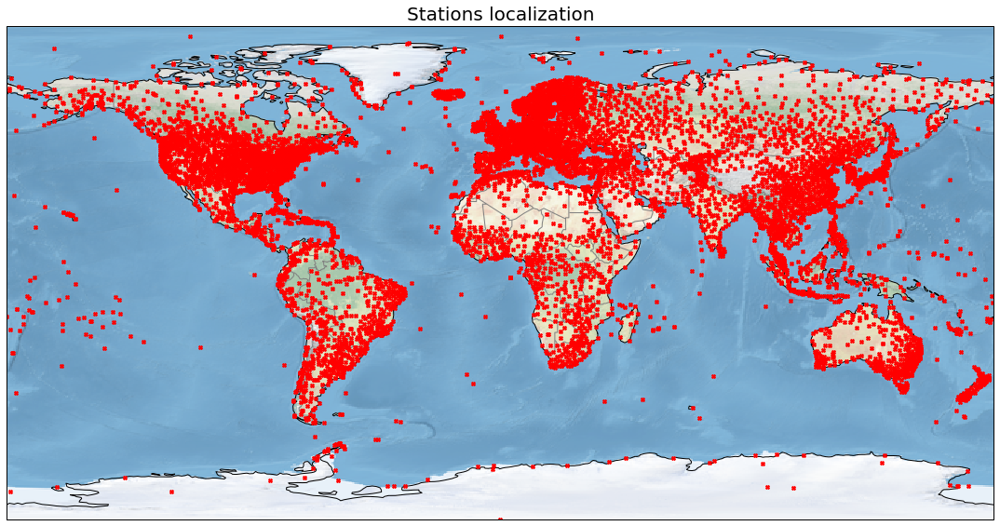

In [7]:
fig = plt.figure(figsize=(19,13))
ax = fig.add_subplot(1,1,1, projection = ccrs.PlateCarree())
ax.stock_img()
ax.set_global()
ax.coastlines()
ax.add_feature(cfeature.BORDERS, edgecolor = 'gray')
ax.add_feature(cfeature.LAND)
ax.plot([metadata["Longitudes"]],[metadata["Latitudes"]], color = 'red', marker = 'X', markersize = 4, transform = ccrs.Geodetic())
plt.xlabel('Longitude', fontsize=18)
plt.ylabel('Latitude', fontsize=16)
plt.title("Stations localization",fontsize=20)
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot0.png")

<font size = 4> 
        I will focus on a period of interest: <b>1960/01/31 - 2014/01/31 </b> then I will select only the stations which present these period
    </font>


In [8]:
data = []
data_obs = []
latitudes = []
longitudes = []
ids = []
country = []
data_anom = []


c = 0
pbar = tqdm_notebook(range(len(Observations)), desc = "Loading stations in the period of interest")
tot = len(Observations)
for obs in Observations:
    
    #print(c / tot)
  
    pbar.update()
    yr = obs.years
    nyr = len(yr)
    
    if (yr[0]>2015 or yr[nyr-1]<1960):
        #pbar.update()
        continue
        
    
    df = obs.df.set_index('Time')
    #df_focus = pd.merge(df_focus,df_int, on ='Time', how = 'left')
    df_anom_t = df - df.mean()
    data_anom.append(df_anom_t)
    data.append(df)
    data_obs.append(obs)
    longitudes.append(-obs.lon)
    latitudes.append(obs.lat)
    ids.append(obs.id)
    country.append(obs.country)

    c = c+1
pbar.close()
        
    


<font size = 4>
Using the <code>obs</code> object method <code> obs.station_plotter </code> we can plot some time series at 
monthly resolution
    </font>

Plotting Time Series with annual resolution


/home/wahid/anaconda3/lib/python3.6/site-packages/pandas/plotting/_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


Plotting Time Series with annual resolution
Plotting Time Series with annual resolution


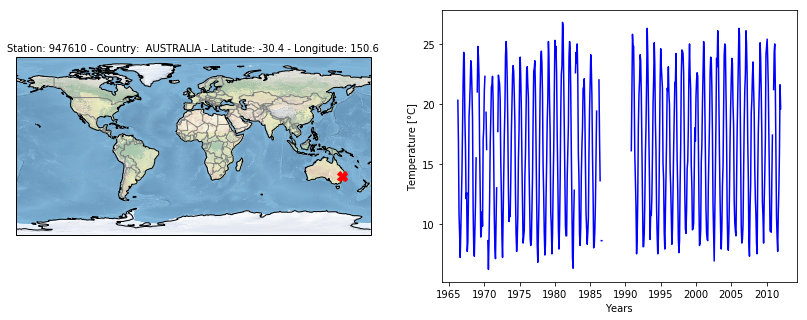

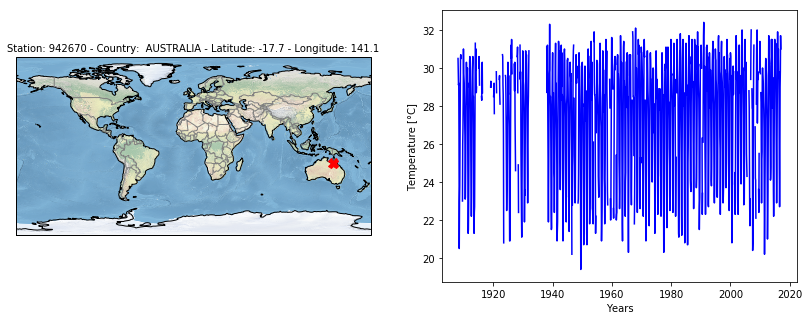

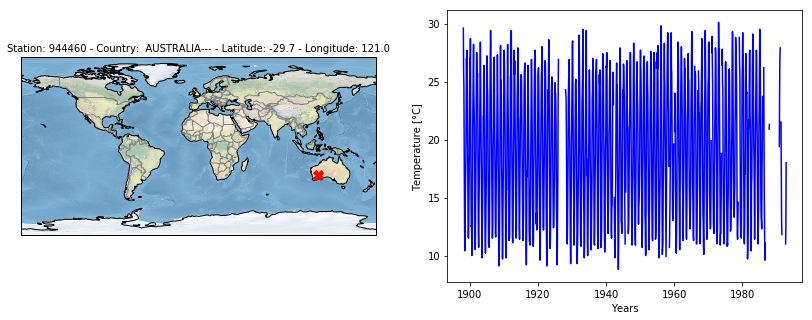

In [9]:
for obs in data_obs[:3]:
    obs.station_plotter('ts_year')
    plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot1.png")

<font size = 4>
    As we can see the time series are not completed, this is because there are <code>NaN</code> values in some periods. <br>        
    </font>

<font size = 4>
Furthermore we can compute the annual mean for each stations and plot the time series at yearly resolution
    </font>

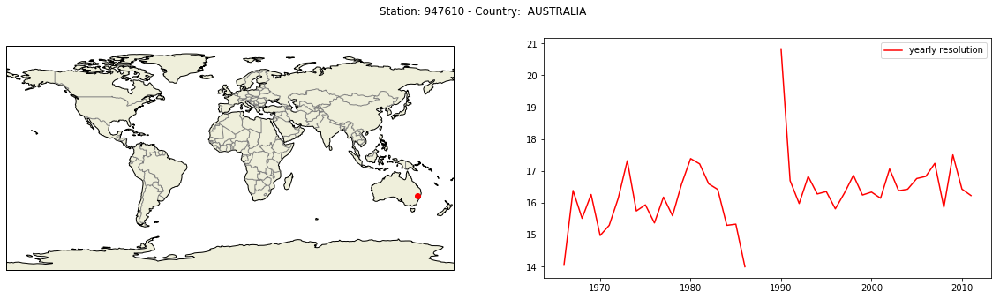

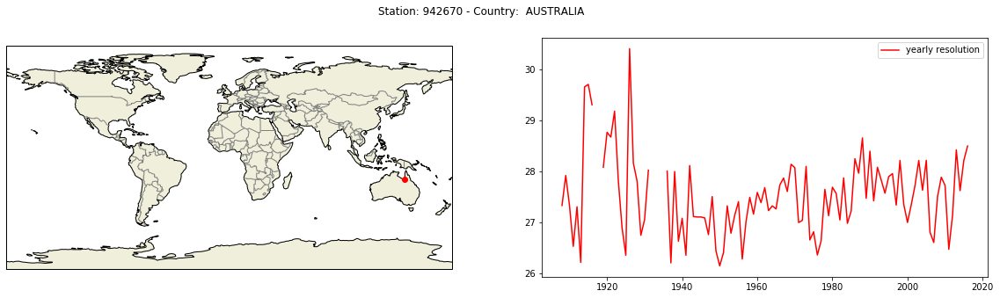

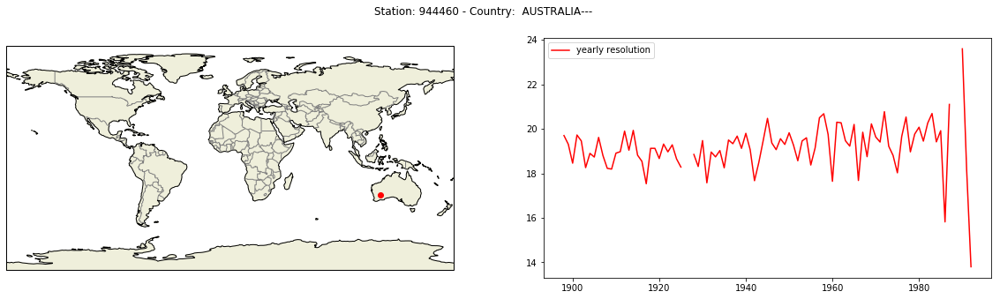

In [10]:
for obs in data_obs[0:3]:
    fig = plt.figure(figsize = (20,5))
    ax = fig.add_subplot(1,2,1,projection = ccrs.PlateCarree())
    ax.set_global()
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, edgecolor='gray')
    ax.add_feature(cfeature.LAND)
    obs_df = obs.df.set_index('Time')
    
    plt.suptitle("Station: {} - Country: {}".format(obs.id,obs.country))
    ax.plot(-obs.lon,obs.lat, marker = 'o',color = 'red', transform = ccrs.Geodetic())
    
    ax = fig.add_subplot(1,2,2)
    
    obs_df_year = obs_df.groupby(obs_df.index.year).mean()
    obs_df_year_mean = obs_df.mean(axis = 0)
    plt.plot(obs_df_year, color = 'red', label = 'yearly resolution')
    plt.legend()
    plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot2.png")
    

<font size = 4>
    We can compute the temperature mean for each month
    </font>

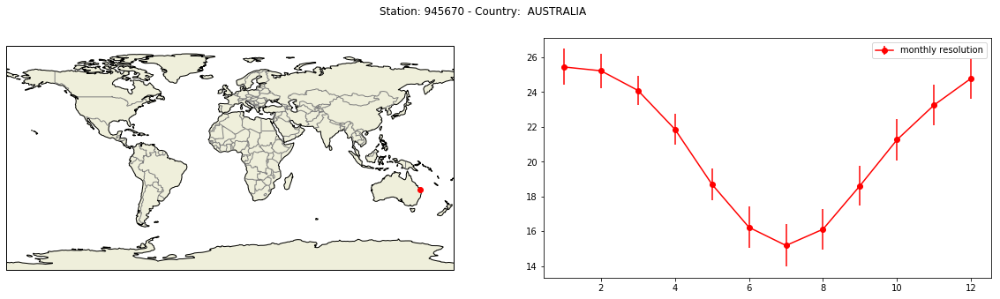

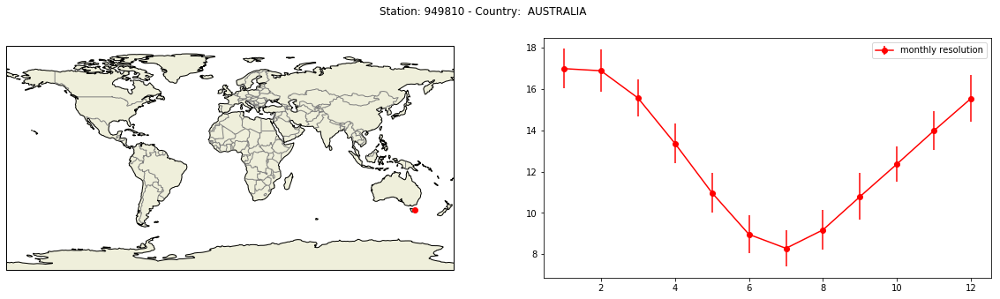

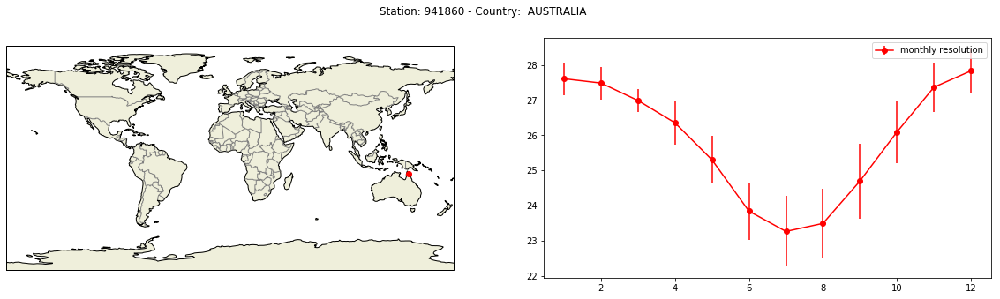

In [11]:
for obs in data_obs[270:273]:
    fig = plt.figure(figsize = (20,5))
    ax = fig.add_subplot(1,2,1,projection = ccrs.PlateCarree())
    ax.set_global()
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, edgecolor='gray')
    ax.add_feature(cfeature.LAND)
    obs_df = obs.df.set_index('Time')
    
    plt.suptitle("Station: {} - Country: {}".format(obs.id,obs.country))
    ax.plot(-obs.lon,obs.lat, marker = 'o',color = 'red', transform = ccrs.Geodetic())
    
    ax = fig.add_subplot(1,2,2)
    obs_df_month = obs_df.groupby(obs_df.index.month).mean()
    obs_df_month_std = obs_df.groupby(obs_df.index.month).std()
    #obs_df_year_mean = obs_df.mean(axis = 0)
    plt.errorbar(obs_df_month.index.values,\
                 obs_df_month.values,yerr= obs_df_month_std.values,marker = 'o',color = 'red', label = 'monthly resolution')
    plt.legend()
    plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot3.png")

<font size = 4 >
Now we can create a new dataframe which contains all the the stations with the associated temperature for each month
    </font>
<font size = 4 >
And also the dataframe which contains the difference from the mean, we call this difference <b>anomaly</b>
    </font>

In [12]:
col = []
for obs in data_obs:
    col.append(obs.id)
    
col_anom = []
for obs in data_obs:
    col_anom.append(obs.id)

In [13]:
taxis = pd.date_range('1960-01', '2015-01', freq='M')
nmonth = len(taxis)
df = pd.DataFrame({'Time': taxis})
df.set_index('Time')

df_anom = pd.DataFrame({'Time': taxis})
df_anom.set_index('Time')

pbar = tqdm_notebook(range(len(data)), desc = "Dataset with the survived stations")

for i in range(0,len(data)):
    
    df = pd.merge(df,data[i], on ='Time', how = 'left')
    df_anom = pd.merge(df_anom,data_anom[i], on ='Time', how = 'left')
    
    pbar.update()
    
pbar.close()
    

df = df.set_index('Time')
df.columns = col

df_anom = df_anom.set_index('Time')
df_anom.columns = col_anom

<font size = 4 >
    Creating the dataframe which contains the metadata of the stations in the period of interest : <code> metadata_int </code>
    </font>

In [14]:
metadata_int = pd.DataFrame({'ids':ids, 'Longitudes': longitudes,
                         'Latitudes': latitudes,'country':country})

<font size = 4>
Now we create the dataframe with yearly resolution for the period of interest
</font>

In [15]:
df_annual_with_nan = df.groupby(pd.Grouper(freq="Y")).mean()

In [16]:
df_annual_with_nan.head()

,947610,942670,944460,948930,943750,945940,945290,942940,947350,948820,...,352330,351210,355760,355320,354260,355420,350410,352290,351730,357460
Time,,,,,,,,,,,,,,,,,,,,,
1960-12-31,NaN,27.581818,17.641667,12.809091,NaN,20.416667,18.827273,23.400000,11.316667,NaN,...,1.891667,3.666667,1.808333,NaN,NaN,3.841667,1.433333,2.958333,NaN,5.875000
1961-12-31,NaN,27.381818,20.300000,14.366667,NaN,20.490909,19.066667,23.658333,11.708333,NaN,...,4.191667,5.591667,4.516667,NaN,NaN,5.958333,3.466667,5.391667,NaN,7.883333
1962-12-31,NaN,27.675000,20.275000,13.733333,NaN,20.675000,18.833333,24.316667,11.341667,NaN,...,4.641667,5.741667,4.858333,NaN,NaN,6.533333,3.850000,5.608333,NaN,8.066667
1963-12-31,NaN,27.225000,19.466667,13.683333,NaN,20.683333,19.333333,23.675000,11.725000,NaN,...,3.916667,4.625000,5.708333,NaN,NaN,6.433333,2.900000,4.841667,NaN,8.608333
1964-12-31,NaN,27.318182,19.225000,13.250000,NaN,20.958333,19.541667,24.491667,11.433333,NaN,...,2.508333,3.416667,3.508333,NaN,NaN,4.633333,1.608333,3.283333,NaN,6.725000


<font size = 4 >
    Plotting the results comparing the time series with annual resolution with the one with month resolution for a single station
    </font>

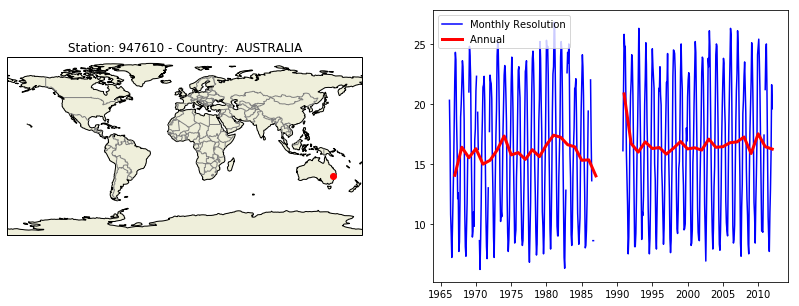

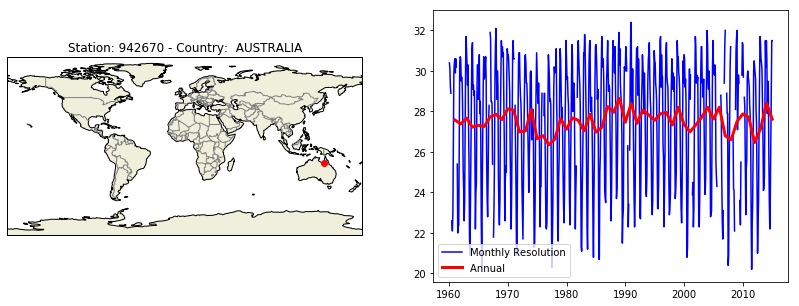

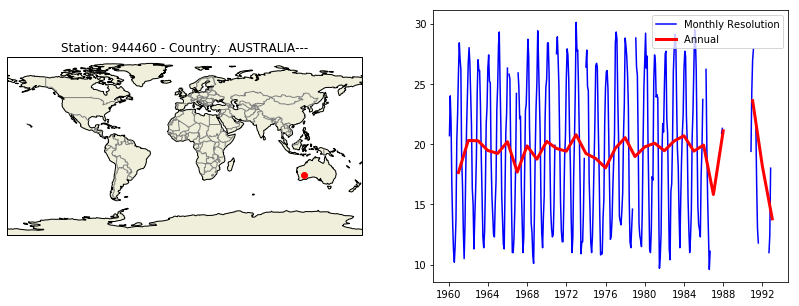

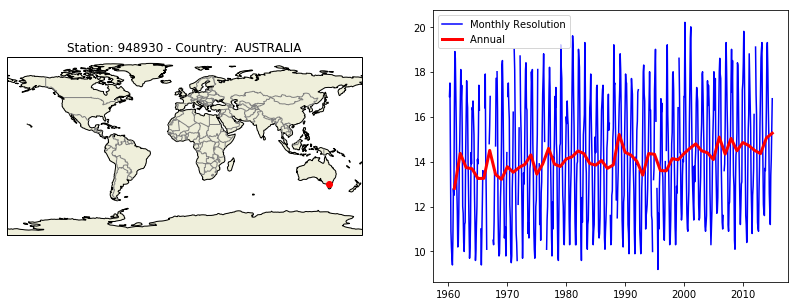

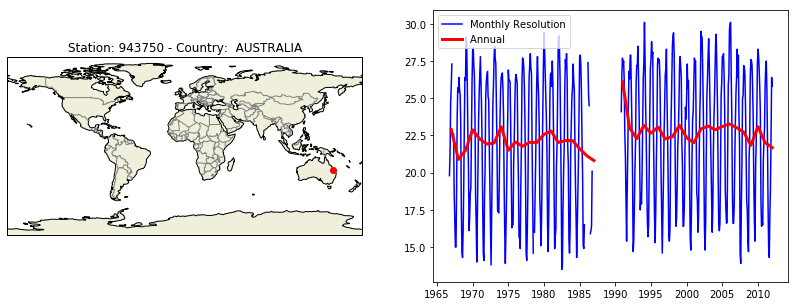

In [17]:
num_plot = 5

pbar = tqdm_notebook(range(num_plot), desc = "Plotting")

for i in range(0,num_plot):  
    
    fig = plt.figure(figsize = (14,5))
    
    ax1 = fig.add_subplot(1,2,1, projection = ccrs.PlateCarree())
    #ax1 = plt.axes(projection = ccrs.PlateCarree())    
    ax1.set_global()
    ax1.coastlines()
    ax1.add_feature(cfeature.BORDERS, edgecolor = 'gray')
    ax1.add_feature(cfeature.LAND)   
    
    #data_obs[i].station_plotter('ts_year')
    temp_df = data_obs[i].df
    ind = np.where(data_obs[i].id == df_annual_with_nan.columns[i])[0][0]
    plt.title('Station: {} - Country: {}'.format(data_obs[i].id,data_obs[i].country))
    ax1.plot(-data_obs[i].lon,data_obs[i].lat,marker = 'o', color = 'red')
    
    
    ax2 = fig.add_subplot(1,2,2)
    #ax1 = plt.axes()
    ax2.plot(df.index ,df.iloc[:,i].values, label = 'Monthly Resolution', color = 'blue')
    ax2.plot(df_annual_with_nan.index,df_annual_with_nan.iloc[:,i].values,color = 'red', linewidth = 3, label = 'Annual ')
    plt.legend()
    pbar.update()
    plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot4.png")
pbar.close()

<font size = 4> 
    I will keep only the station with a continous time series. Building a new Dataframe (<code>df_non_nan</code>) containing the continous time series. I will use the method <code> dropna </code> on a subset of the total dataframe <code> df </code>
    </font>

In [18]:
x1=df.index.get_loc('1960-01-31')
x2=df.index.get_loc('2014-11-30')
df_no_nan = df.copy()

In [19]:
df_no_nan.dropna(axis='columns',inplace= True, subset=(df_no_nan.index[x1:x2]) )  # ,thresh=10

In [20]:
df_no_nan.head()

,943670,949750,948680,946930,943000,949260,947760,942030,948210,944610,...,726887,726631,720392,725232,350780,351270,351880,350260,351210,350410
Time,,,,,,,,,,,,,,,,,,,,,
1960-01-31,26.0,18.5,23.2,27.2,25.6,22.2,24.4,29.2,19.5,30.6,...,-9.8,-6.5,4.4,-2.8,-15.0,-10.0,-13.3,-12.3,-10.1,-14.4
1960-02-29,26.0,16.3,20.0,22.2,27.0,19.9,22.1,29.1,16.6,29.5,...,-7.6,-8.3,3.5,-2.3,-15.1,-12.9,-15.0,-13.5,-13.0,-13.6
1960-03-31,24.5,16.0,20.3,22.3,24.6,17.1,20.1,29.8,16.9,27.9,...,-3.0,-3.0,1.8,-4.9,-17.1,-13.0,-16.8,-13.6,-11.6,-13.7
1960-04-30,22.7,12.3,16.0,16.4,22.6,13.5,18.3,30.1,12.9,22.3,...,3.3,6.6,15.7,9.5,1.5,6.2,0.6,3.3,6.5,4.7
1960-05-31,18.8,10.1,12.1,11.3,18.2,8.0,14.7,22.9,10.2,13.5,...,6.0,13.0,17.7,14.3,7.7,10.2,8.5,6.8,10.6,8.2


In [21]:
#df_no_nan = df.dropna(axis = 'columns', how='any')

<font size = 4 >
    Now I have to build a new dataframe which contains the metadata. I have to look for the stations I dropped with the previous operation
    </font>

In [22]:
cols_id = np.array(df_no_nan.columns)
metadata_id = np.array(metadata_int['ids'].values)
metadata_id[:5]

array([947610, 942670, 944460, 948930, 943750])

In [23]:
i = 0
ind = []
met = []
while i < len(metadata_id):
    if metadata_id[i] in cols_id:
         met.append(metadata_id[i])
    else:
        ind.append(i)
        
    i += 1

<font size = 4>
    The list <code> ind </code> contains the indeces of the stations dropped before
    </font>

In [24]:
metadata_int.head()
metadata_int.set_index('ids').head()

,Longitudes,Latitudes,country
ids,,,
947610,150.6,-30.4,AUSTRALIA
942670,141.1,-17.7,AUSTRALIA
944460,121.0,-29.7,AUSTRALIA---
948930,146.4,-39.1,AUSTRALIA
943750,149.8,-24.2,AUSTRALIA


<font size = 4 >
    I will create a new metadata dataframe <code> metadata_int_nonan </code> from the previous one (<code> metadata_int </code>), exploiting the method <code> drop </code>, passing as argument the list with the indices of the dropped stations
    </font>

In [25]:
metadata_int_nonan = metadata_int.drop(ind,axis = 0)

In [26]:
df_no_nan.head()

,943670,949750,948680,946930,943000,949260,947760,942030,948210,944610,...,726887,726631,720392,725232,350780,351270,351880,350260,351210,350410
Time,,,,,,,,,,,,,,,,,,,,,
1960-01-31,26.0,18.5,23.2,27.2,25.6,22.2,24.4,29.2,19.5,30.6,...,-9.8,-6.5,4.4,-2.8,-15.0,-10.0,-13.3,-12.3,-10.1,-14.4
1960-02-29,26.0,16.3,20.0,22.2,27.0,19.9,22.1,29.1,16.6,29.5,...,-7.6,-8.3,3.5,-2.3,-15.1,-12.9,-15.0,-13.5,-13.0,-13.6
1960-03-31,24.5,16.0,20.3,22.3,24.6,17.1,20.1,29.8,16.9,27.9,...,-3.0,-3.0,1.8,-4.9,-17.1,-13.0,-16.8,-13.6,-11.6,-13.7
1960-04-30,22.7,12.3,16.0,16.4,22.6,13.5,18.3,30.1,12.9,22.3,...,3.3,6.6,15.7,9.5,1.5,6.2,0.6,3.3,6.5,4.7
1960-05-31,18.8,10.1,12.1,11.3,18.2,8.0,14.7,22.9,10.2,13.5,...,6.0,13.0,17.7,14.3,7.7,10.2,8.5,6.8,10.6,8.2


In [27]:
metadata_int_nonan.head()

,ids,Longitudes,Latitudes,country
21,943670,149.2,-21.1,AUSTRALIA
27,949750,147.5,-42.8,AUSTRALIA
37,948680,145.0,-37.8,AUSTRALIA
48,946930,142.1,-34.2,AUSTRALIA
94,943000,113.7,-24.9,AUSTRALIA


In [28]:
longitudes_new = []
latitudes_new = []
ids_new = []
country_new = []

<font size = 4 >
    Plotting the localization of the survived stations (in red) compared with the all stations (in green)
        </font>

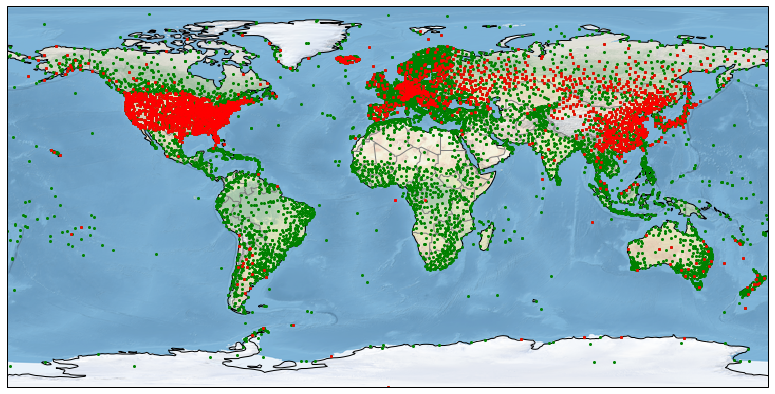

In [29]:
lon = metadata['Longitudes']
lat = metadata['Latitudes']

fig = plt.figure(figsize=(30,15))
ax = fig.add_subplot(1,2,1, projection = ccrs.PlateCarree())
ax.stock_img()
ax.set_global()
ax.coastlines()
ax.add_feature(cfeature.BORDERS, edgecolor = 'gray')
ax.add_feature(cfeature.LAND)
ax.plot([lon],[lat], marker = 'o',markersize = 2, color = 'green')
ax.plot([metadata_int_nonan["Longitudes"]],[metadata_int_nonan["Latitudes"]], color = 'red', marker = 'X', markersize = 2, transform = ccrs.Geodetic())
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot5.png")
plt.show()

In [30]:
print("Number of stations :{} - Number of the survived stations: {}".format(len(metadata_int['Latitudes']),len(metadata_int_nonan['Latitudes'])))

Number of stations :10094 - Number of the survived stations: 2721


<font size = 4>
    As we can see a lot of stations have been dropped. And we have only a few regions with a high density of stations, like the USA. As we can see we have lost about the 71% of stations. This is an important reduction of the dataset, and different techniques of data recovery could be implemented in order to drop less stations
    </font>

In [31]:
df_no_nan.columns

Int64Index([943670, 949750, 948680, 946930, 943000, 949260, 947760, 942030,
            948210, 944610,
            ...
            726887, 726631, 720392, 725232, 350780, 351270, 351880, 350260,
            351210, 350410],
           dtype='int64', length=2721)

In [32]:
len(df_no_nan.index)

660

<font size=4>
    Plotting the station position with the associated <i>continous</i> time series 
    </font>

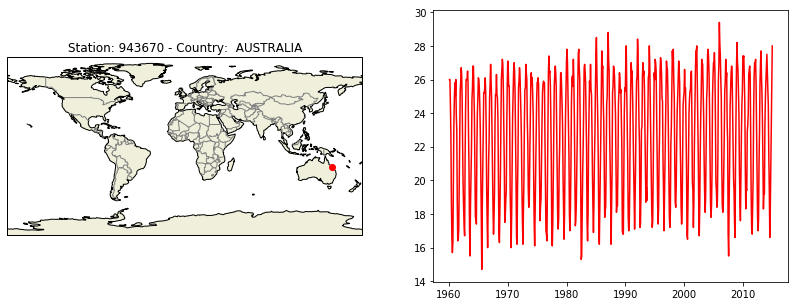

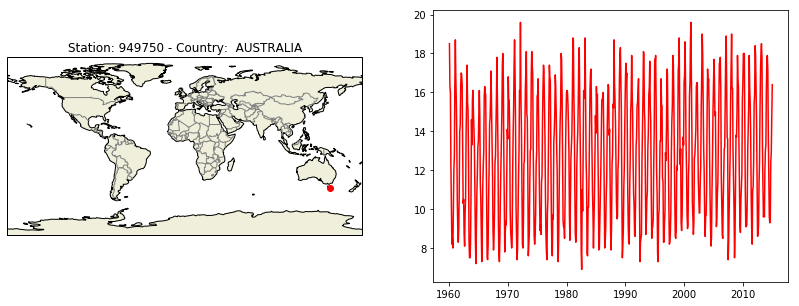

In [33]:
for i in range(0,2):
    
    fig = plt.figure(figsize = (14,5))
    
    ax1 = fig.add_subplot(1,2,1, projection = ccrs.PlateCarree())
    #ax1 = plt.axes(projection = ccrs.PlateCarree())    
    ax1.set_global()
    ax1.coastlines()
    ax1.add_feature(cfeature.BORDERS, edgecolor = 'gray')
    ax1.add_feature(cfeature.LAND)
    ind = np.where(metadata_int_nonan['ids'] == df_no_nan.columns[i])[0][0]
    #print(metadata.iloc[ind].country)
    plt.title('Station: {} - Country: {}'.format(metadata_int_nonan.iloc[ind].ids,metadata_int_nonan.iloc[ind].country))
    lon = metadata_int_nonan.iloc[ind].Longitudes
    lat = metadata_int_nonan.iloc[ind].Latitudes
    ax1.plot(lon,lat,marker = 'o', color = 'red')
    
    
    ax2 = fig.add_subplot(1,2,2)
    #ax1 = plt.axes()    
    ax2.plot(df_no_nan.index,df_no_nan.iloc[:,i].values, color = 'red')
    plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot6.png")
    
    
    

    
    

<font size = 4>
    Time series in annual resolution
    </font>

In [34]:
#Printing a short description of the results obtained so far
print("Dataframe: df_no_nan head \n{}\n".format(df_no_nan.head()))
print("Dataframe: df_no_nan shape \n{}:".format(df_no_nan.shape))


Dataframe: df_no_nan head 
            943670  949750  948680  946930  943000  949260  947760  942030  \
Time                                                                         
1960-01-31    26.0    18.5    23.2    27.2    25.6    22.2    24.4    29.2   
1960-02-29    26.0    16.3    20.0    22.2    27.0    19.9    22.1    29.1   
1960-03-31    24.5    16.0    20.3    22.3    24.6    17.1    20.1    29.8   
1960-04-30    22.7    12.3    16.0    16.4    22.6    13.5    18.3    30.1   
1960-05-31    18.8    10.1    12.1    11.3    18.2     8.0    14.7    22.9   

            948210  944610  ...  726887  726631  720392  725232  350780  \
Time                        ...                                           
1960-01-31    19.5    30.6  ...    -9.8    -6.5     4.4    -2.8   -15.0   
1960-02-29    16.6    29.5  ...    -7.6    -8.3     3.5    -2.3   -15.1   
1960-03-31    16.9    27.9  ...    -3.0    -3.0     1.8    -4.9   -17.1   
1960-04-30    12.9    22.3  ...     3.3     6.6    

<font size=4>
    Now I will plot the new time series comparing the yearly resolution with the monthly one. First of all I will copy the current dataframe in order to don't lose all the results.
    </font>

In [35]:
df_annual = df_no_nan.copy()

<font size = 4 >
    Creating the x-axis with the years <code> taxis_annual </code>
    </font>

In [36]:
taxis = df_no_nan.index

taxis_annual = taxis.year
taxis_annual

Int64Index([1960, 1960, 1960, 1960, 1960, 1960, 1960, 1960, 1960, 1960,
            ...
            2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014],
           dtype='int64', name='Time', length=660)

In [37]:
df_annual.index = taxis_annual


In [38]:
df_annual.head()

,943670,949750,948680,946930,943000,949260,947760,942030,948210,944610,...,726887,726631,720392,725232,350780,351270,351880,350260,351210,350410
Time,,,,,,,,,,,,,,,,,,,,,
1960,26.0,18.5,23.2,27.2,25.6,22.2,24.4,29.2,19.5,30.6,...,-9.8,-6.5,4.4,-2.8,-15.0,-10.0,-13.3,-12.3,-10.1,-14.4
1960,26.0,16.3,20.0,22.2,27.0,19.9,22.1,29.1,16.6,29.5,...,-7.6,-8.3,3.5,-2.3,-15.1,-12.9,-15.0,-13.5,-13.0,-13.6
1960,24.5,16.0,20.3,22.3,24.6,17.1,20.1,29.8,16.9,27.9,...,-3.0,-3.0,1.8,-4.9,-17.1,-13.0,-16.8,-13.6,-11.6,-13.7
1960,22.7,12.3,16.0,16.4,22.6,13.5,18.3,30.1,12.9,22.3,...,3.3,6.6,15.7,9.5,1.5,6.2,0.6,3.3,6.5,4.7
1960,18.8,10.1,12.1,11.3,18.2,8.0,14.7,22.9,10.2,13.5,...,6.0,13.0,17.7,14.3,7.7,10.2,8.5,6.8,10.6,8.2


<font size = 4 >
    Building the new dataframe with yearly resolution <code>df_annual </code> without <code>NaN</code> values and in the period of interest and the one with the mean of all months <code> df_month </code>
    </font>

In [39]:
#df_annual.index = taxis_annual
df_annual = df_annual.groupby('Time').mean()
df_month = df_no_nan.groupby(df_no_nan.index.month).mean()
df_month_std = df_no_nan.groupby(df_no_nan.index.month).std()
new_taxis_annual = pd.date_range(taxis[0],taxis[-1], freq = 'Y')


<font size = 4>
    Plotting the time series with yearly resolution compared with the one at monthly resolution after the cleansing.
    </font>

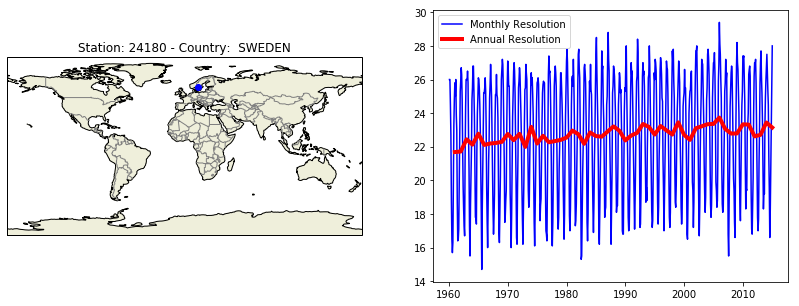

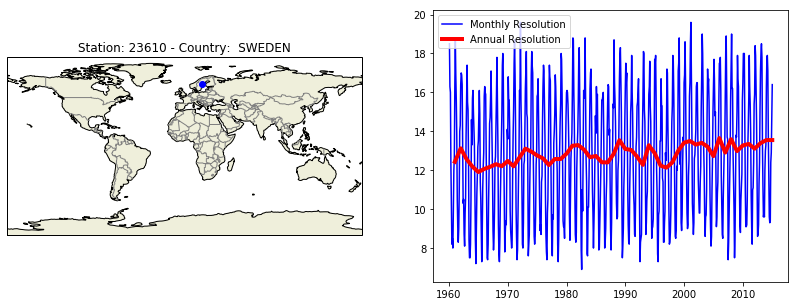

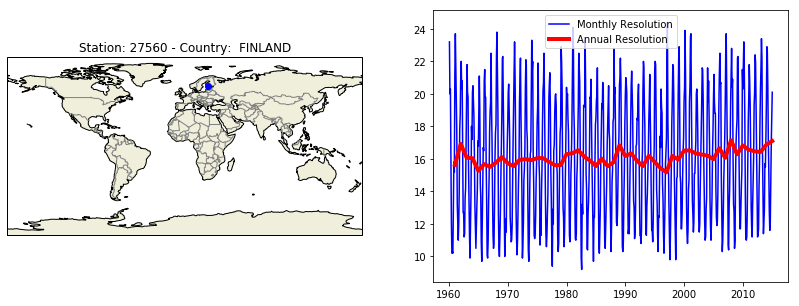

In [40]:
for i in range(0,3):
        
    fig = plt.figure(figsize = (14,5))
    
    ax1 = fig.add_subplot(1,2,1, projection = ccrs.PlateCarree())
    #ax1 = plt.axes(projection = ccrs.PlateCarree())    
    ax1.set_global()
    ax1.coastlines()
    ax1.add_feature(cfeature.BORDERS, edgecolor = 'gray')
    ax1.add_feature(cfeature.LAND)
    ind = np.where(metadata_int['ids'] == df_no_nan.columns[i])[0][0]
    #print(metadata.iloc[ind].country)
    lon = -metadata_int_nonan.iloc[ind].Longitudes
    lat = metadata_int_nonan.iloc[ind].Latitudes
    plt.title('Station: {} - Country: {}'.format(metadata_int_nonan.iloc[ind].ids,metadata_int_nonan.iloc[ind].country))
    ax1.plot(-lon,lat,marker = 'o', color = 'blue')
    
    
    ax2 = fig.add_subplot(1,2,2)
    #ax1 = plt.axes()    
    ax2.plot(df_no_nan.index ,df_no_nan.iloc[:,i].values, label = 'Monthly Resolution', color = 'blue')
    ax2.plot(new_taxis_annual,df_annual.iloc[:,i].values,linewidth = 4, label = 'Annual Resolution', color = 'red')
    
    plt.legend()
    plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot7.png")

<font size = 4 >
    Plotting the time series with annual resolution with one with the mean of each month
    </font>

In [41]:
df_month

,943670,949750,948680,946930,943000,949260,947760,942030,948210,944610,...,726887,726631,720392,725232,350780,351270,351880,350260,351210,350410
Time,,,,,,,,,,,,,,,,,,,,,
1,26.830909,17.265455,21.305455,24.638182,27.076364,20.687273,23.216364,29.674545,18.561818,30.376364,...,-7.474545,-6.094545,2.703636,-3.830909,-17.185455,-12.894545,-15.254545,-14.161818,-12.918182,-15.285455
2,26.509091,17.200000,21.507273,24.320000,28.161818,21.083636,22.950909,29.450909,18.880000,29.380000,...,-4.778182,-3.865455,4.138182,-3.152727,-16.767273,-12.787273,-15.081818,-13.212727,-12.692727,-14.681818
3,25.423636,15.821818,19.738182,21.129091,26.994545,16.996364,21.263636,29.561818,17.190909,26.872727,...,-0.445455,0.572727,8.421818,1.352727,-9.469091,-5.441818,-7.552727,-6.585455,-5.445455,-7.454545
4,23.414545,13.434545,16.607273,16.920000,24.163636,14.432727,18.363636,28.605455,14.510909,22.667273,...,4.003636,6.541818,13.689091,7.694545,4.245455,7.220000,5.463636,3.687273,7.063636,4.869091
5,20.621818,10.958182,13.710909,13.145455,20.596364,8.976364,15.218182,24.681818,11.974545,17.338182,...,8.409091,12.318182,18.234545,13.894545,13.009091,15.572727,13.694545,11.656364,15.541818,13.498182
6,17.949091,8.749091,11.365455,10.492727,17.849091,7.172727,12.800000,22.012727,9.960000,14.078182,...,12.694545,17.845455,22.674545,18.954545,18.740000,20.558182,19.327273,16.303636,20.189091,18.721818
7,17.092727,8.327273,10.761818,9.885455,16.570909,5.983636,11.770909,21.429091,9.372727,13.552727,...,16.785455,22.400000,24.850909,21.307273,20.112727,22.569091,20.680000,18.045455,22.147273,20.136364
8,18.287273,9.156364,11.827273,11.287273,17.338182,7.012727,12.765455,22.158182,10.030909,15.767273,...,15.925455,21.352727,24.032727,20.280000,17.698182,20.578182,18.274545,15.876364,20.227273,17.883636
9,20.981818,10.803636,13.583636,14.094545,19.125455,9.616364,15.350909,25.680000,11.298182,20.370909,...,10.925455,15.276364,20.350909,16.470909,11.654545,13.961818,12.332727,9.927273,13.929091,11.818182


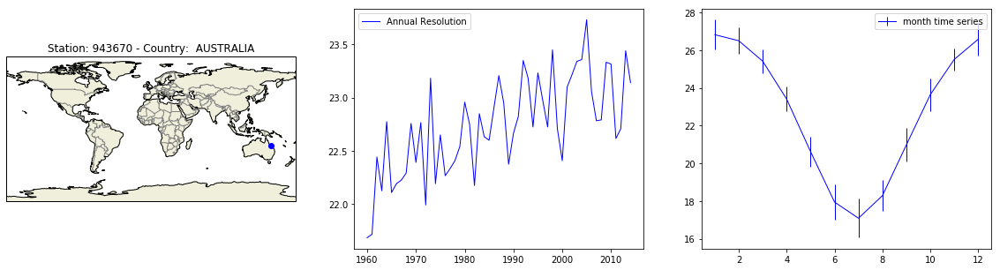

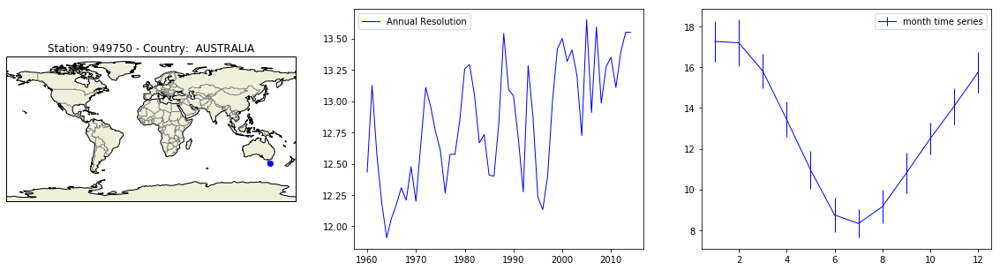

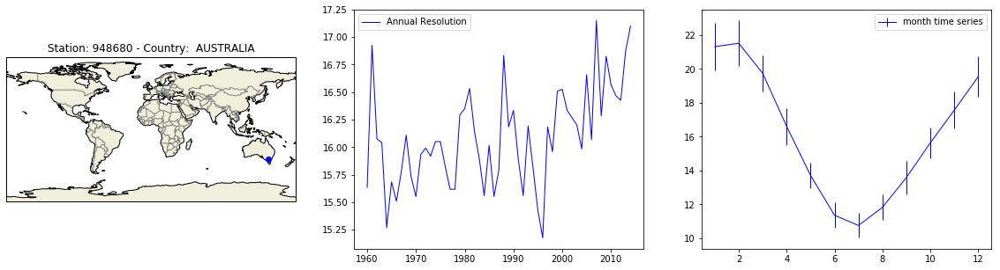

In [42]:
for i in range(0,3):
        
    fig = plt.figure(figsize = (20,5))
    
    ax1 = fig.add_subplot(1,3,1, projection = ccrs.PlateCarree())
    #ax1 = plt.axes(projection = ccrs.PlateCarree())    
    ax1.set_global()
    ax1.coastlines()
    ax1.add_feature(cfeature.BORDERS, edgecolor = 'gray')
    ax1.add_feature(cfeature.LAND)
    ind = np.where(metadata_int_nonan['ids'] == df_no_nan.columns[i])[0][0]
    #print(metadata.iloc[ind].country)
    lon = -metadata_int_nonan.iloc[ind].Longitudes
    lat = metadata_int_nonan.iloc[ind].Latitudes
    plt.title('Station: {} - Country: {}'.format(metadata_int_nonan.iloc[ind].ids,metadata_int_nonan.iloc[ind].country))
    ax1.plot(-lon,lat,marker = 'o', color = 'blue')
    
    
    ax2 = fig.add_subplot(1,3,2)
    #ax1 = plt.axes()    
    #ax2.plot(df_no_nan.index ,df_no_nan.iloc[:,i].values, label = 'Monthly Resolution', color = 'deepskyblue')
    ax2.plot(df_annual.index,df_annual.iloc[:,i].values,linewidth = 1, label = 'Annual Resolution', color = 'blue')
    plt.legend()
    ax2 = fig.add_subplot(1,3,3)
    
    plt.errorbar(df_month.index.values,df_month.iloc[:,i].values, yerr = df_month_std.iloc[:,i],\
                 label = 'month time series', color = 'blue', linewidth = 1)
    
    plt.legend()
    plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot8.png")

<font size = 4> As we can see from the yearly resolution time series we have a trend that is increasing during the years

In [43]:
df_no_nan.head()

,943670,949750,948680,946930,943000,949260,947760,942030,948210,944610,...,726887,726631,720392,725232,350780,351270,351880,350260,351210,350410
Time,,,,,,,,,,,,,,,,,,,,,
1960-01-31,26.0,18.5,23.2,27.2,25.6,22.2,24.4,29.2,19.5,30.6,...,-9.8,-6.5,4.4,-2.8,-15.0,-10.0,-13.3,-12.3,-10.1,-14.4
1960-02-29,26.0,16.3,20.0,22.2,27.0,19.9,22.1,29.1,16.6,29.5,...,-7.6,-8.3,3.5,-2.3,-15.1,-12.9,-15.0,-13.5,-13.0,-13.6
1960-03-31,24.5,16.0,20.3,22.3,24.6,17.1,20.1,29.8,16.9,27.9,...,-3.0,-3.0,1.8,-4.9,-17.1,-13.0,-16.8,-13.6,-11.6,-13.7
1960-04-30,22.7,12.3,16.0,16.4,22.6,13.5,18.3,30.1,12.9,22.3,...,3.3,6.6,15.7,9.5,1.5,6.2,0.6,3.3,6.5,4.7
1960-05-31,18.8,10.1,12.1,11.3,18.2,8.0,14.7,22.9,10.2,13.5,...,6.0,13.0,17.7,14.3,7.7,10.2,8.5,6.8,10.6,8.2


<center><h2> Start with gridding </h2></center>

<font size = 4 >
    Now I will aggregate the stations. The idea is to create a grid which each cells contains a certain number of stations. After the gridding I will take the contribution of each cells and compute the temperature mean.
    </font>

<center><h3> Initializing some arrays </h3></center><br>
<font size=4>
Essentially the idea is to build an empty grid with a fixed resolution and the to fill this grid with the stations.
For this purpose we istantiate several arrays, for latitudes and for longitudes in order to build all the grids.
    </font>
    

In [44]:
resol = 20 #5  # degrees (E and N)
nlon = np.int(360/resol)
nlat = np.int(180/resol)

resol = 20 #5  # degrees (E and N)
nlon = np.int(360/resol)
nlat = np.int(180/resol)

# define grid cell margins
grlons = np.empty([nlon+1],dtype='float') 
grlats = np.empty([nlat+1],dtype='float') 
grlons[0] = -180.
grlats[0] = -90.
for i in range(1,nlon+1):
    grlons[i]=grlons[i-1]+resol
for i in range(1,nlat+1):
    grlats[i]=grlats[i-1]+resol



print("Grid for longitudes: \n{}\n".format(grlons))
print("Grid for latitudes: \n{}\n".format(grlats))



Grid for longitudes: 
[-180. -160. -140. -120. -100.  -80.  -60.  -40.  -20.    0.   20.   40.
   60.   80.  100.  120.  140.  160.  180.]

Grid for latitudes: 
[-90. -70. -50. -30. -10.  10.  30.  50.  70.  90.]



<font size=4>
    We have to keep track of the coordinates of each stations filled in the grid. So we istatiate array that can be filled with the coordinates and with the number of the years
    </font>

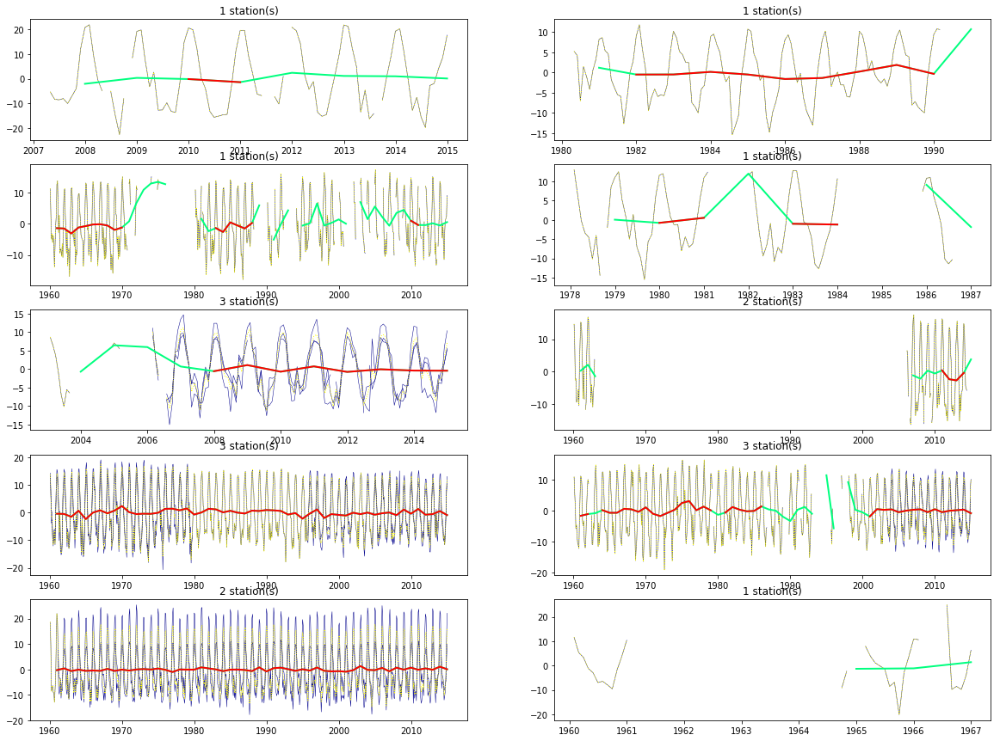

In [45]:
nmonths = len(taxis) #same lenght of dataframe df.index
gridmo = np.ma.zeros([nmonths,nlon,nlat],dtype='float')  # [nlon,nlat]
gridy = np.zeros([np.int(nmonths/12),nlon,nlat],dtype='float') 
gridy0 = np.zeros([np.int(nmonths/12),nlon,nlat],dtype='float')
gridmo.fill(np.nan)
gridy.fill(np.nan)
gridy0.fill(np.nan)
times = pd.to_datetime(df.index)
ty = pd.date_range('1960-01', '2015-01', freq='Y')
njahre = len(ty)


# prepare to visualize the following steps 

fig = plt.figure(figsize=(20,15))
subplots = (5,2)
n_panels = subplots[0] * subplots[1]
ax = [ plt.subplot(subplots[0], subplots[1], 1), 
       plt.subplot(subplots[0], subplots[1], 2),
       plt.subplot(subplots[0], subplots[1], 3),
       plt.subplot(subplots[0], subplots[1], 4),
       plt.subplot(subplots[0], subplots[1], 5),
       plt.subplot(subplots[0], subplots[1], 6),
       plt.subplot(subplots[0], subplots[1], 7),
       plt.subplot(subplots[0], subplots[1], 8), 
       plt.subplot(subplots[0], subplots[1], 9),
       plt.subplot(subplots[0], subplots[1], 10) ]

qq=-1  # initialize counter for the filled grid cells

# aggregate at monthly and annual pace all stations within grid box

# loop over all the grid cells 
pbar = tqdm_notebook(range((nlat-1)*nlon), desc = "Gridding")
for j in range(0,nlat-1):
    
    #print(j/(nlat-1))

    for i in range(0,nlon):
        
        
        zz = -1

        for fi, f in enumerate(list(df_anom)):
            
            
            latid = metadata_int.Latitudes[fi]
            longit = metadata_int.Longitudes[fi]
            
            if (latid >=grlats[j] and latid < grlats[j+1] and longit >= grlons[i] and longit<grlons[i+1]):
                
                zz = zz + 1 
                
            
                if (zz == 0):

                    #print("sono qui")

                    dfij = pd.DataFrame({'Time': taxis, f:df_anom[f] })
                    dfij = dfij.set_index('Time')

                else:

                    xdfij = pd.DataFrame({'Time': taxis, f:df_anom[f] })
                    xdfij = xdfij.set_index('Time')
                    dfij = pd.merge(dfij, xdfij, on= 'Time', how='left')
                
        if (zz >= 0): 

            gridmo[:,i,j] = np.ma.masked_invalid(dfij).mean(axis=1)
            gridy0[:,i,j] = dfij.mean(axis=1, skipna=True).resample("Y").mean()
            dfijc = pd.DataFrame(gridmo[:,i,j], columns = list('f') )
            dfijc['date'] = taxis
            dfijc = dfijc[['date','f']]
            dfijc = dfijc.set_index([dfijc['date'].dt.year, dfijc['date'].dt.month])
            dfijc.dropna(axis='rows',inplace= True)

            # Get a count of the number of months in each year
            count = dfijc.set_index([dfijc['date'].dt.year, dfijc['date'].dt.month]).count(level=0)
            count = count.drop(count[count.date < 12].index)

            # Retain only months associated to complete years
            years = count[count['date'] == 12].index
            dfijc = dfijc[dfijc['date'].dt.year.isin(years)]

            # Now rearrange the index
            dfijc.index = [datetime.strptime(str(f'{a}-{b}'), "%Y-%m") for a, b in dfijc.index]
            dfijc.index = pd.to_datetime(dfijc.index, unit='s')#.strftime('%Y-%m')
            dfijc.index.names = ['Time']
            dfijc.drop(dfijc.columns[0], axis=1, inplace=True)

            # Align the unique day associate to the months
            dfijm = pd.DataFrame({'Time': taxis-pd.offsets.MonthBegin()})
            dfijm = dfijm.set_index('Time')  
            dfijm = pd.merge(dfijm, dfijc, on='Time', how='left')

            gridy[:,i,j] = dfijm.mean(axis=1, skipna=True).resample("Y").mean()

            qq = qq + 1


            if ( (qq >= 0) & (qq < (n_panels)) ):

                ax[qq].plot(dfij,color='darkblue',linewidth=0.5) 
                ax[qq].plot(taxis,gridmo[:,i,j],color='yellow',linewidth=1,linestyle=':', label = "monthly TS") 
                ax[qq].plot(ty,gridy0[:,i,j],color='springgreen',linewidth=2) 
                ax[qq].plot(ty,gridy[:,i,j],color='red',linewidth=2) 
                ax[qq].set_title(''.join([str(zz+1),' station(s)']))
            
        pbar.update()
         
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot9.png")    
    
pbar.close()





The blue line represent the time series of each station present in the current cell. The yellow lines represent the monthly time series found averaging on all the stations present in the current cell. The green lines represent the yearly time series computed averaging over the all stations present in the current cell by averagin on time. The red line is like the green time series but cleaned, in particular I have removed the incomplete years for the time series since the incomplete years introduce a bias.

<font size = 4 >Now I will plot the yearly time series associated to each grid, then I will compute the mean. 

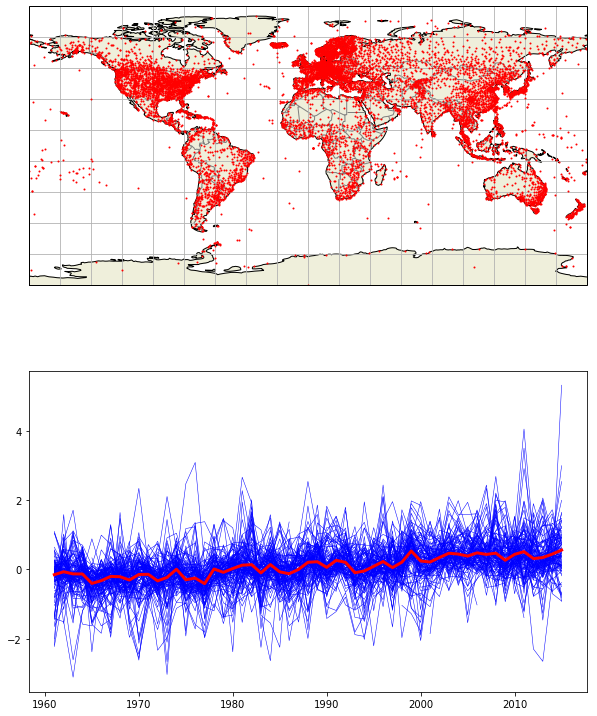

In [46]:
min_lon = -180
max_lon = 180
min_lat = -90
max_lat = 90

fig = plt.figure(figsize = (10,13))

subplots = (2,1)

proj = ccrs.PlateCarree()

ax = [plt.subplot(subplots[0],subplots[1],1, projection = proj),
      plt.subplot(subplots[0],subplots[1],2) ]

central_lons = (grlons[0:len(grlons)-1]+grlons[1:])/2.

central_lats = (grlats[0:len(grlats)-1]+grlats[1:])/2.


ax[0].set_global()
ax[0].add_feature(cfeature.LAND)
ax[0].gridlines(xlocs = range(int(np.ceil(min_lon)),int(np.ceil(max_lon)+1),resol),\
                ylocs=(range(int(np.ceil(min_lat)),int(np.ceil(max_lat)+1),resol)))
ax[0].coastlines()
ax[0].add_feature(cfeature.BORDERS,edgecolor = 'gray')
ax[0].set_extent([min_lon, max_lon, min_lat, max_lat], ccrs.PlateCarree())

c = metadata_int.set_index('ids')

pbar = tqdm_notebook(range(len(list(df_anom))), desc = "Plotting the stations localization")
for fi, f in enumerate(list(df_anom)):
    #print(f)
    ax[0].plot(c.Longitudes[f],\
               c.Latitudes[f],\
               color ='red',marker = 'o',markersize = 1,transform = ccrs.Geodetic())
    pbar.update()
pbar.close()
   
glob0 = np.ma.zeros([len(ty)],dtype = float)*0.0
gridym = np.ma.asarray(gridy)
globt = np.ma.zeros([len(ty)], dtype = float)
globt.fill(np.nan)

w = np.ma.zeros([len(ty)],dtype = float)

pbar = tqdm_notebook(range((nlat-1)*nlon), desc = "Plotting the time series")
for j in range(0,nlat-1):
    #print(j/(nlat-1))
    for i in range(0,nlon):
        
        ax[1].plot(ty,gridy[:,i,j],color = 'blue',linewidth = 0.5)
            
        temp = np.vstack([globt, gridym[:,i,j]*cos(radians(central_lats[j]))])

        glob0[:] = np.nansum(temp,axis = 0)

        globt = glob0

        mask = gridym[:,i,j]
        mask[np.isnan(mask)] = 0.
        mask[np.abs(mask) > 0.] = 1.

        w = w + cos(radians(central_lats[j]))*mask
        #print(w)

        if(central_lats[j+1] < central_lats[j]):
            print("Wrong direction for latitudes")
            break
            
        pbar.update()
        
pbar.close()
        
globw = globt/w

ax[1].plot(ty,globw, color = 'red', linewidth = 3)
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot10.png")





<font size = 4>
    From the previous plot we can see that the mean has a small slope, we can try to do a Linear Regression on this behaviour in order to look for some incresing trend
    </font>

R2-score : 0.7640419892344846
Angular coefficient: [0.01488256]


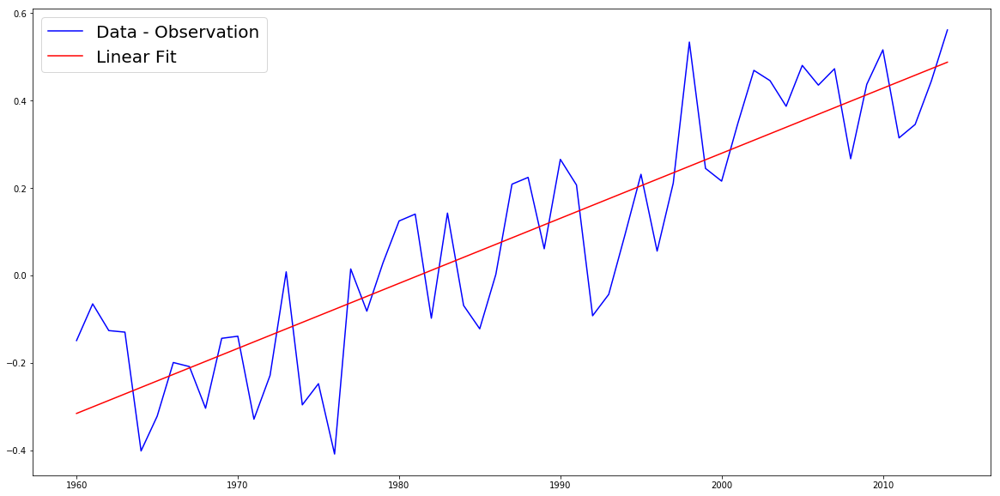

In [47]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


regr = LinearRegression()
x_train = np.arange(1960,2015,1)
x_train.shape

x_train = x_train.reshape(-1,1)


regr.fit(x_train,globw.data)

y_pred = regr.predict(x_train)
fig = plt.figure(figsize = (20,10))
plt.plot(x_train,globw.data,color = "blue",label = "Data - Observation")
plt.plot(x_train,y_pred,color = "red" ,label = "Linear Fit")
plt.legend(fontsize = 20)
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot11.png")

r2 = r2_score(globw.data,y_pred)

print("R2-score : {}".format(r2))
print("Angular coefficient: {}".format(regr.coef_))


<font size = 4>
    Clearly the regression doesn't work properly because the mean trend oscillate a lot, but in the other hand the regression give us an idea and we can see clearly that we have a temperature trend which is increasing during the years.
    In particular we have the following relation: <code> &#916;Anomaly = 0.013 &#916;Years </code>.   
    </font>

<center><h3> Slicing on a region </h3></center>

<font size = 4 >
As we saw after the cleansing we have only few regions with a high density of stations. In particular one of them is the USA region.
We can focus on this region and make some analysis.
    </font>

In [48]:
print("Metadata in the interested period without NaN: \n{} \n".format(metadata_int_nonan.head()))
print("Dataframe in the interested period without NaN: \n{}\n".format(df_no_nan.head()))

Metadata in the interested period without NaN: 
       ids  Longitudes  Latitudes     country
21  943670       149.2      -21.1   AUSTRALIA
27  949750       147.5      -42.8   AUSTRALIA
37  948680       145.0      -37.8   AUSTRALIA
48  946930       142.1      -34.2   AUSTRALIA
94  943000       113.7      -24.9   AUSTRALIA 

Dataframe in the interested period without NaN: 
            943670  949750  948680  946930  943000  949260  947760  942030  \
Time                                                                         
1960-01-31    26.0    18.5    23.2    27.2    25.6    22.2    24.4    29.2   
1960-02-29    26.0    16.3    20.0    22.2    27.0    19.9    22.1    29.1   
1960-03-31    24.5    16.0    20.3    22.3    24.6    17.1    20.1    29.8   
1960-04-30    22.7    12.3    16.0    16.4    22.6    13.5    18.3    30.1   
1960-05-31    18.8    10.1    12.1    11.3    18.2     8.0    14.7    22.9   

            948210  944610  ...  726887  726631  720392  725232  350780  \
Tim

In [49]:

lat_slice = []
lon_slice = []
ids_slice = []
country_slice = []

ids_to_slice = []

ids_row = metadata_int_nonan['ids'].values
metadata_int_nonan_ind = metadata_int_nonan.set_index('ids') 

metadata_int_nonan_slice = metadata_int_nonan_ind.copy()
df_sliced = df_no_nan.copy()    
        
        
    
    

In [50]:

metadata_int_nonan_slice = metadata_int_nonan_ind.drop(ids_to_slice)
metadata_int_nonan_slice.head()

,Longitudes,Latitudes,country
ids,,,
943670,149.2,-21.1,AUSTRALIA
949750,147.5,-42.8,AUSTRALIA
948680,145.0,-37.8,AUSTRALIA
946930,142.1,-34.2,AUSTRALIA
943000,113.7,-24.9,AUSTRALIA


In [51]:
df_sliced = df_no_nan.drop(columns = ids_to_slice)
df_sliced.head()

,943670,949750,948680,946930,943000,949260,947760,942030,948210,944610,...,726887,726631,720392,725232,350780,351270,351880,350260,351210,350410
Time,,,,,,,,,,,,,,,,,,,,,
1960-01-31,26.0,18.5,23.2,27.2,25.6,22.2,24.4,29.2,19.5,30.6,...,-9.8,-6.5,4.4,-2.8,-15.0,-10.0,-13.3,-12.3,-10.1,-14.4
1960-02-29,26.0,16.3,20.0,22.2,27.0,19.9,22.1,29.1,16.6,29.5,...,-7.6,-8.3,3.5,-2.3,-15.1,-12.9,-15.0,-13.5,-13.0,-13.6
1960-03-31,24.5,16.0,20.3,22.3,24.6,17.1,20.1,29.8,16.9,27.9,...,-3.0,-3.0,1.8,-4.9,-17.1,-13.0,-16.8,-13.6,-11.6,-13.7
1960-04-30,22.7,12.3,16.0,16.4,22.6,13.5,18.3,30.1,12.9,22.3,...,3.3,6.6,15.7,9.5,1.5,6.2,0.6,3.3,6.5,4.7
1960-05-31,18.8,10.1,12.1,11.3,18.2,8.0,14.7,22.9,10.2,13.5,...,6.0,13.0,17.7,14.3,7.7,10.2,8.5,6.8,10.6,8.2


<font size = 4>
    I will make a selection off all the stations in the USA. To do this I will look for all the stations that has as attribute <b>country</b> the name USA. I have to build a new metadata dataframe, and as before I will keep track of the stations dropped and then I will drop this stations in the previous metadata dataframe.
    </font>

In [52]:
lon_slice = []
lat_slice = []

lat_slice = []
lon_slice = []
ids_slice = []
country_slice = []

ids_to_slice = []

ids_row = metadata_int_nonan['ids'].values
metadata_int_nonan_ind_country = metadata_int_nonan.set_index('ids') 

metadata_int_nonan_slice = metadata_int_nonan_ind.copy()
df_sliced = df_no_nan.copy()

pbar = tqdm_notebook(range(len(metadata_int_nonan_ind['Latitudes'].values)), desc = "Selecting a region")
for i in range(0,len(metadata_int_nonan_ind['Latitudes'].values)):
    
    lat_t = metadata_int_nonan_ind['Latitudes'].values[i]
    lon_t = -metadata_int_nonan_ind['Longitudes'].values[i]
    
    
    if(metadata_int_nonan_ind['country'].str.contains('USA').values[i] == True):
        
        #print(metadata_int_nonan_ind['country'].values[i])
        lat_slice.append(lat_t)
        lon_slice.append(-lon_t)
        ids_slice.append(metadata_int_nonan_ind.index[i])
        country_slice.append(metadata_int_nonan_ind['country'].values[i])
        
        
    else:
        ids_to_slice.append(ids_row[i])
    
    pbar.update()
pbar.close()
        #print(metadata_int_nonan_ind['country'].values[i])
              
        
        
    

In [53]:
metadata_int_nonan_slice.head()
metadata_int_nonan_sliced = metadata_int_nonan_slice.drop(ids_to_slice)
df_sliced = df_sliced.drop(columns = ids_to_slice)

<font size=4> 
    Plotting the region of filtered data
    </font>

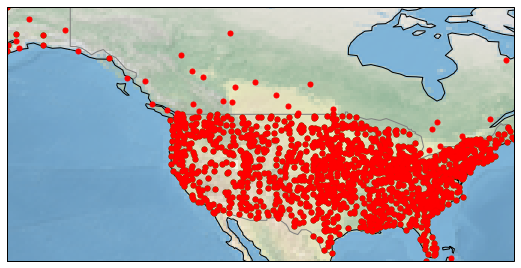

In [54]:
min_lon = min(lon_slice)
max_lon = max(lon_slice)
min_lat = min(lat_slice)
max_lat = max(lat_slice)

fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1,2,1, projection = ccrs.PlateCarree())
ax.stock_img()
ax.set_global()
ax.set_extent([min_lon, max_lon, min_lat, max_lat], ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, edgecolor = 'gray')
ax.add_feature(cfeature.LAND)
ax.plot([lon_slice],[lat_slice], marker = 'o',markersize= 5,color = 'green')
ax.plot([metadata_int_nonan.Longitudes],[metadata_int_nonan.Latitudes], marker = 'o',markersize= 5,color = 'red')
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot12.png")
plt.show()

<font size = 4 >
    Plotting some Time Series for the USA stations. Comparison between monthly resolution and with the yearly one
    </font>

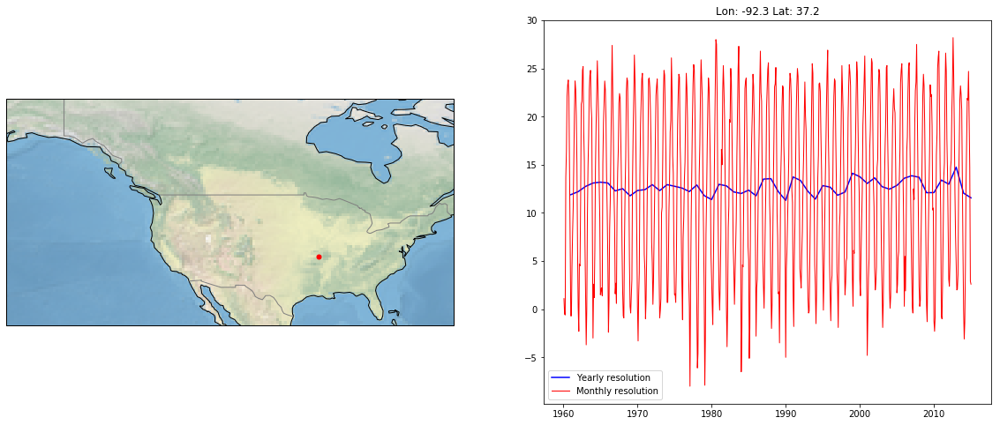

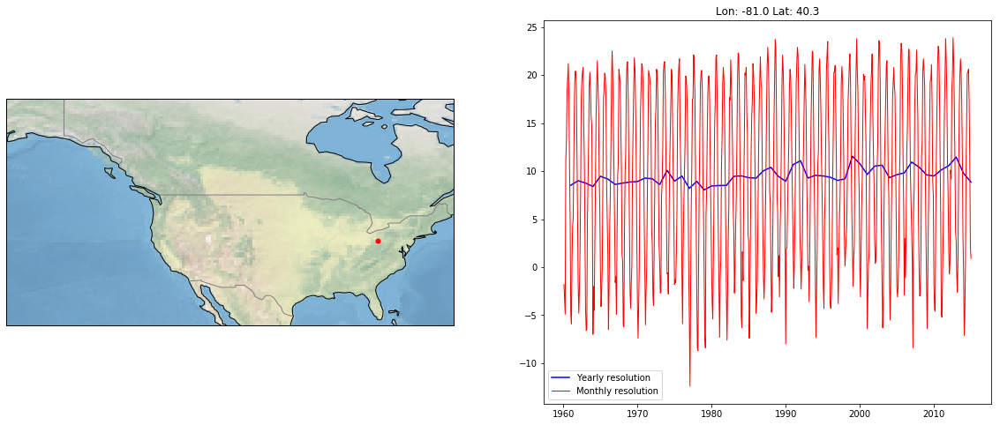

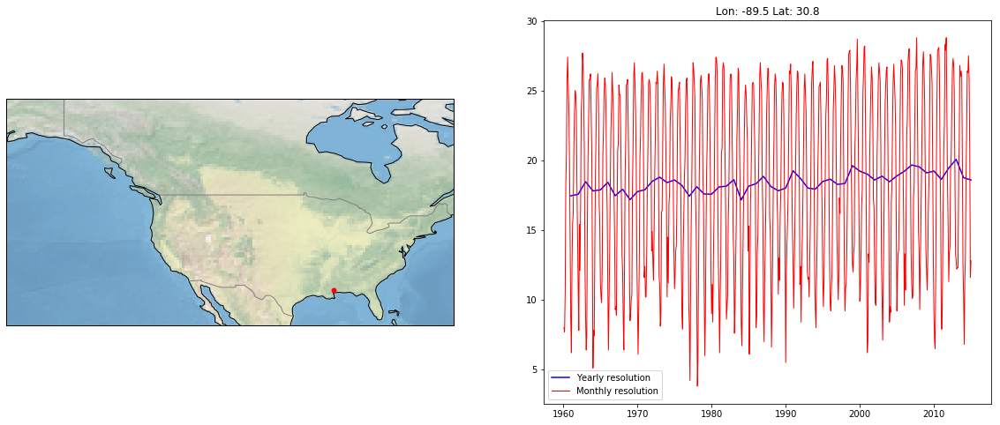

In [55]:
for i in range(0,3):
    
    fig = plt.figure(figsize=(20,8))
    ax = fig.add_subplot(1,2,1, projection = ccrs.PlateCarree())
    ax.stock_img()
    ax.set_global()
    ax.set_extent([min_lon-0.5, max_lon+0.5, min_lat-0.5, max_lat+0.5], ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, edgecolor = 'gray')
    ax.add_feature(cfeature.LAND)
    ax.plot(lon_slice[i],lat_slice[i], marker = 'o',markersize= 5,color = 'RED')
    ax1 = fig.add_subplot(1,2,2)
    a = df_sliced.groupby(df_sliced.index.year).mean()
    ax1.plot(pd.date_range('1960-01', '2015-01', freq='Y'),a.iloc[:,i], color = 'blue', label = "Yearly resolution")
    plt.title("Lon: {} Lat: {}".format(lon_slice[i],lat_slice[i]))
    ax1.plot(df_sliced[df_sliced.columns[i]], linewidth = 1, color = "red", label = "Monthly resolution")
    plt.legend()
    plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot13.png")

    
    plt.show()
    

<font size = 4>
    As before I will grid this region and then I will take the contributes of each cell.
    </font>

In [56]:
deltalon = np.ceil(max_lon) - np.ceil(min_lon)
deltalat = np.ceil(max_lat) - np.ceil(min_lat)

In [57]:
resol = 7 #5  # degrees (E and N)
nlons = np.int(deltalon/resol)
nlats = np.int(deltalat/resol)

# define grid cell margins
grlons_sl = np.empty([nlons+1],dtype='float') 
grlats_sl = np.empty([nlats+1],dtype='float') 
grlons_sl[0] = np.ceil(min_lon)
grlats_sl[0] = np.ceil(min_lat)
for i in range(1,nlons+1):
    grlons_sl[i]=grlons_sl[i-1]+resol
for i in range(1,nlats+1):
    grlats_sl[i]=grlats_sl[i-1]+resol


print("Grid for longitudes: \n{}\n".format(grlons_sl))
print("Grid for latitudes: \n{}\n".format(grlats_sl))



Grid for longitudes: 
[-151. -144. -137. -130. -123. -116. -109. -102.  -95.  -88.  -81.  -74.
  -67.]

Grid for latitudes: 
[25. 32. 39. 46. 53. 60. 67.]



In [58]:
taxis_sl = df_sliced.index
nmonths_sl = len(taxis_sl) #same lenght of dataframe df.index
gridmo_sl = np.ma.zeros([nmonths_sl,nlons,nlats],dtype='float')  # [nlon,nlat]
gridy_sl = np.zeros([np.int(nmonths_sl/12),nlons,nlats],dtype='float') 
gridy_sl1 = np.zeros([np.int(nmonths_sl/12),nlons,nlats],dtype='float') 
gridy0_sl = np.zeros([np.int(nmonths_sl/12),nlons,nlats],dtype='float')
gridmo_sl.fill(np.nan)
gridy_sl.fill(np.nan)
gridy0_sl.fill(np.nan)
times_sl = pd.to_datetime(df_sliced.index)
ty_sl = pd.date_range('1960-01', '2015-01', freq='Y')

print("Metadata array annual: \n{}\n".format(gridy_sl[:2,:5,:5]))
print("Metadata array month: \n{}".format(gridmo_sl[:2,:5,:5]))

Metadata array annual: 
[[[nan nan nan nan nan]
  [nan nan nan nan nan]
  [nan nan nan nan nan]
  [nan nan nan nan nan]
  [nan nan nan nan nan]]

 [[nan nan nan nan nan]
  [nan nan nan nan nan]
  [nan nan nan nan nan]
  [nan nan nan nan nan]
  [nan nan nan nan nan]]]

Metadata array month: 
[[[nan nan nan nan nan]
  [nan nan nan nan nan]
  [nan nan nan nan nan]
  [nan nan nan nan nan]
  [nan nan nan nan nan]]

 [[nan nan nan nan nan]
  [nan nan nan nan nan]
  [nan nan nan nan nan]
  [nan nan nan nan nan]
  [nan nan nan nan nan]]]


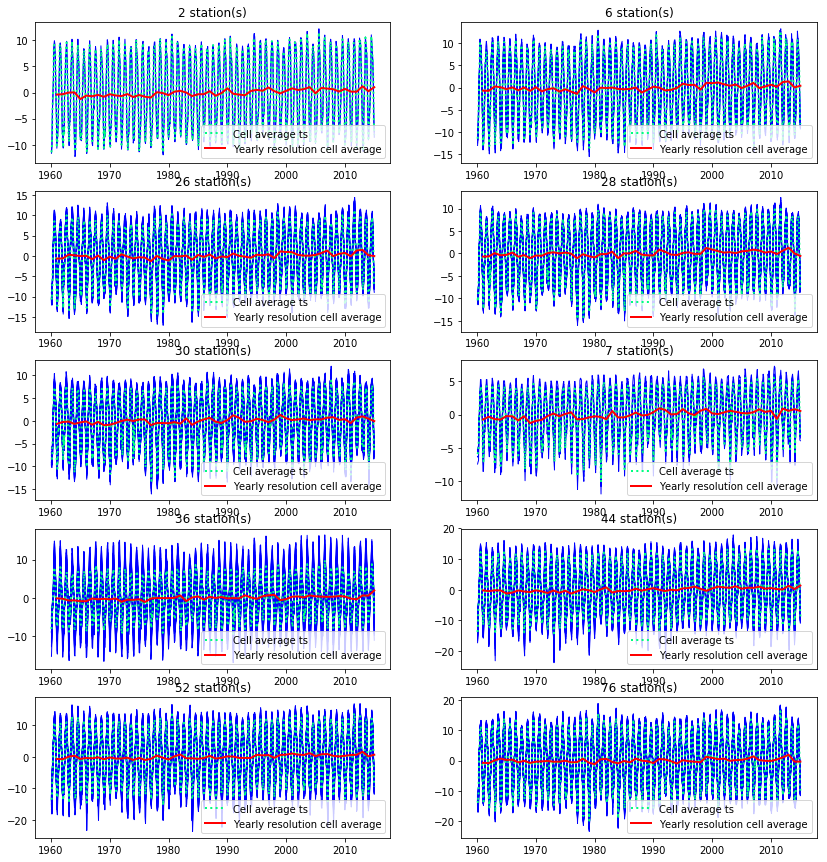

In [59]:
#Initializing the counter for the filled grid cells
fig = plt.figure(figsize=(14,15))
subplots = (5,2)
n_panels = subplots[0] * subplots[1]
ax = [ plt.subplot(subplots[0], subplots[1], 1), 
       plt.subplot(subplots[0], subplots[1], 2),
       plt.subplot(subplots[0], subplots[1], 3),
       plt.subplot(subplots[0], subplots[1], 4),
       plt.subplot(subplots[0], subplots[1], 5),
       plt.subplot(subplots[0], subplots[1], 6),
       plt.subplot(subplots[0], subplots[1], 7),
       plt.subplot(subplots[0], subplots[1], 8), 
       plt.subplot(subplots[0], subplots[1], 9),
       plt.subplot(subplots[0], subplots[1], 10) ]


qq = -1

k = df_sliced - df_sliced.mean()
pbars = tqdm_notebook(range((nlats -1)*nlons), desc = "Gridding")
for j in range(0, nlats - 1):
    for i in range(0,nlons):
        
        zz = -1 #Counter of the stations in the cells
        
        for fi, f in enumerate(list(k)):
            #print(fi)#List df return list of the id stations
                    #f loops on the id of the stations
            #print(fi,f)
            latid = metadata_int_nonan_sliced.Latitudes[f]
            longit = metadata_int_nonan_sliced.Longitudes[f]
            if(latid >= grlats_sl[j] and latid < grlats_sl[j+1] \
                and longit >= grlons_sl[i] and longit < grlons_sl[i+1]):
                
                zz = zz + 1 
#Initializing local dataframe in order to distinguish which station pass from not passed

                if(zz == 0):
                    
                    dfij = pd.DataFrame({'Time': taxis, f:k[f]})
                    dfij = dfij.set_index('Time')
                
                else:
                    
                    xdfij = pd.DataFrame({'Time':taxis, f:k[f]})
                    xdfij = xdfij.set_index('Time')
                    dfij = pd.merge(dfij,xdfij, on = 'Time', how = 'left') 
                    
        if (zz >= 0):    

            # get the current grid cell average time series from all the included stations' time series
            # - plot 2c: green lines are all the stations in current grid cell
            # - plot 2c: yellow dotted lines are the current grid cell average time series
            gridmo_sl[:,i,j] = np.ma.masked_invalid(dfij).mean(axis=1) #np.ma.mean(dfij,axis=1)

            # resample the current grid cell average time series at yearly resolution, by averaging in time
            # - pink lines in plot 2c
            gridy0_sl[:,i,j] = dfij.mean(axis=1, skipna=True).resample("Y").mean()   
            #dfij.where(dfij < 0, -dfij)       

            # By including incomplete years (with not all of 12 months) we introduce a bias
            # Correct by removing the incomplete years from the time series

            # Duplicate the current grid cell average time series
            dfijc = pd.DataFrame(gridmo_sl[:,i,j], columns = list('f') )
            dfijc['date'] = taxis_sl
            dfijc = dfijc[['date','f']]         
            


            # Split the index in year and month (multi-index)
            dfijc = dfijc.set_index([dfijc['date'].dt.year, dfijc['date'].dt.month])
            dfijc.dropna(axis='rows',inplace= True)

            # Get a count of the number of months in each year
            count = dfijc.set_index([dfijc['date'].dt.year, dfijc['date'].dt.month]).count(level=0)
            count = count.drop(count[count.date < 12].index)

            # Retain only months associated to complete years
            years = count[count['date'] == 12].index
            dfijc = dfijc[dfijc['date'].dt.year.isin(years)]

            # Now rearrange the index
            dfijc.index = [datetime.strptime(str(f'{a}-{b}'), "%Y-%m") for a, b in dfijc.index]
            dfijc.index = pd.to_datetime(dfijc.index, unit='s')#.strftime('%Y-%m')
            

            
            dfijc.index.names = ['time']
            dfijc.drop(dfijc.columns[0], axis=1, inplace=True)

            # Align the unique day associate to the months
            dfijm = pd.DataFrame({'time': taxis-pd.offsets.MonthBegin()})
            dfijm = dfijm.set_index('time')  
            dfijm = pd.merge(dfijm, dfijc, on='time', how='left')

            # resample the current (clean) grid cell average time series at yearly resolution, by averaging in time
            # - red lines in plot 2c
            gridy_sl[:,i,j] = dfijm.mean(axis=1, skipna=True).resample("Y").mean()
            gridy_sl1[:,i,j] = dfijm.mean(axis=1, skipna=True).resample("Y").mean()
            
            #Plotting 
            
            qq = qq + 1

            if ( (qq >= 0) & (qq < (n_panels)) ):
                ax[qq].plot(dfij,color='blue',linewidth=1) #Plot the time series of the stations (with nan)
                ax[qq].plot(taxis_sl,gridmo_sl[:,i,j],color='springgreen',linewidth=2,linestyle=':',label = 'Cell average ts') 
                #Time series yearly resolution only where the TS is present
                ax[qq].plot(ty_sl,gridy_sl[:,i,j],color='red',linewidth=2, label ="Yearly resolution cell average") 
                ax[qq].set_title(''.join([str(zz+1),' station(s)']))
                ax[qq].legend()
                
        pbars.update()
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot14.png")    
pbars.close()

    
                    
            

<h3>Gridding visualization</h3>

<font size = 4>
    Plotting the time series of each cell and computing the mean.
    </font>

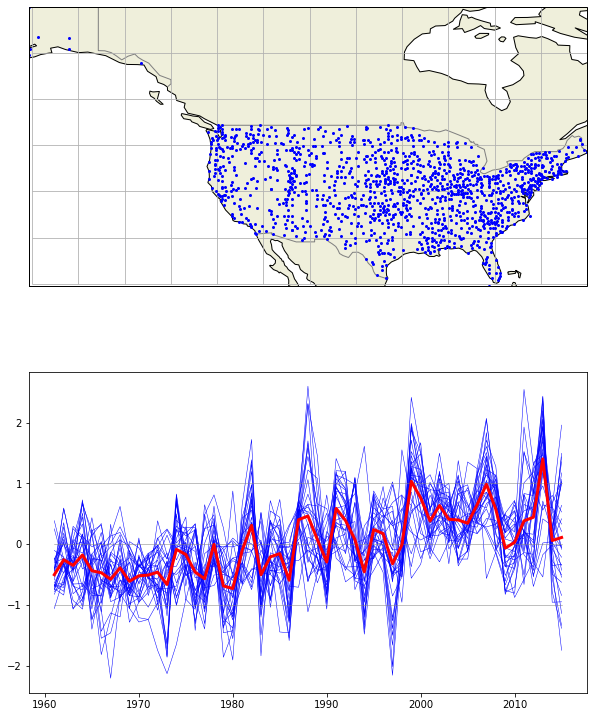

In [60]:
fig = plt.figure(figsize = (10,13))

subplots = (2,1)

proj = ccrs.PlateCarree()

ax = [plt.subplot(subplots[0],subplots[1],1, projection = proj),
      plt.subplot(subplots[0],subplots[1],2) ]

central_lons = (grlons_sl[0:len(grlons_sl)-1]+grlons_sl[1:])/2.

central_lats = (grlats_sl[0:len(grlats_sl)-1]+grlats_sl[1:])/2.


ax[0].set_global()
ax[0].add_feature(cfeature.LAND)
ax[0].gridlines(xlocs = range(int(np.ceil(min_lon)),int(np.ceil(max_lon)+1),resol),\
                ylocs=(range(int(np.ceil(min_lat)),int(np.ceil(max_lat)+1),resol)))
ax[0].coastlines()
ax[0].add_feature(cfeature.BORDERS,edgecolor = 'gray')
ax[0].set_extent([min_lon, max_lon, min_lat, max_lat], ccrs.PlateCarree())


pbar = tqdm_notebook(range(len(list(k))), desc = "Plotting stations localization")
for fi, f in enumerate(list(k)):
    ax[0].plot(metadata_int_nonan_sliced.Longitudes[f],\
               metadata_int_nonan_sliced.Latitudes[f],\
               color ='blue',marker = 'o',markersize = 2, transform = ccrs.Geodetic())
    pbar.update()
pbar.close()
    
glob0 = np.ma.zeros([len(ty_sl)],dtype = float)*0.0
gridym = np.ma.asarray(gridy_sl)
globt = np.ma.zeros([len(ty_sl)], dtype = float)
globt.fill(np.nan)

w = np.ma.zeros([len(ty_sl)],dtype = float)

pbar = tqdm_notebook(range((nlats-1)*nlons), desc = "Plotting time series")
for j in range(0,nlats-1):
    for i in range(0,nlons):
        
        ax[1].plot(ty_sl,gridy_sl[:,i,j],color = 'blue',linewidth = 0.5)
            
        temp = np.vstack([globt, gridym[:,i,j]*cos(radians(central_lats[j]))])

        glob0[:] = np.nansum(temp,axis = 0)

        globt = glob0

        mask = gridym[:,i,j]
        mask[np.isnan(mask)] = 0.
        mask[np.abs(mask) > 0.] = 1.

        w = w + cos(radians(central_lats[j]))*mask
        #print(w)

        if(central_lats[j+1] < central_lats[j]):
            print("Wrong direction for latitudes")
            break
        pbar.update()
pbar.close()
        
globw = globt/w
ax[1].plot([ty_sl[0],ty_sl[len(ty_sl)-1]],[0,0], color = "grey", linewidth = 0.5)
ax[1].plot([ty_sl[0],ty_sl[len(ty_sl)-1]],[1,1], color = "grey", linewidth = 0.5)
ax[1].plot([ty_sl[0],ty_sl[len(ty_sl)-1]],[-1,-1], color = "grey", linewidth = 0.5)
ax[1].plot(ty_sl,globw, color = 'red', linewidth = 3)
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot15.png")





<font size = 4>
    As before I will try to do a linear regression on the mean trend in order to find the slope of this trend
    </font>

R2-score : 0.042033954520176
Angular coefficient: [0.02198249]


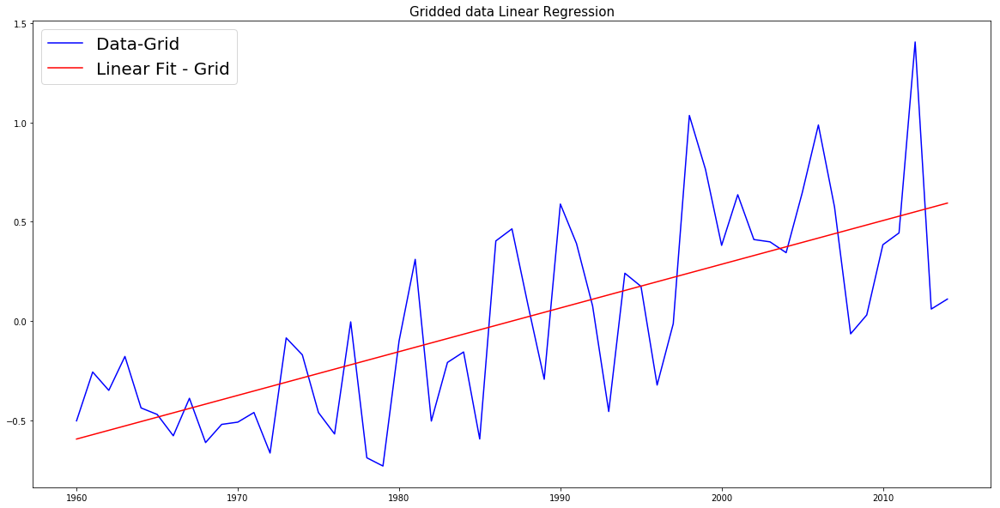

In [61]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


regr_obs = LinearRegression()
x_train = np.arange(1960,2015,1)
x_train.shape

x_train = x_train.reshape(-1,1)


regr_obs.fit(x_train,globw.data)

y_pred_obs = regr_obs.predict(x_train)
fig = plt.figure(figsize = (20,10))
plt.plot(x_train,globw.data,color = "blue",label = "Data-Grid")
plt.plot(x_train,y_pred_obs,color = "red" ,label = "Linear Fit - Grid")
#plt.plot(x_train,globt.data)
plt.legend(fontsize = 20)
plt.title("Gridded data Linear Regression", fontsize = 15)
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot16.png")


r2 = r2_score(globt.data,y_pred_obs)

print("R2-score : {}".format(r2))
print("Angular coefficient: {}".format(regr_obs.coef_))

<font size = 4>
    We can try to do the same regression on the data not gridded and compare the two results
    </font>

In [62]:
df_sliced_mean = df_sliced - df_sliced.mean()

In [63]:
df_sliced_year = df_sliced_mean.groupby(df_sliced.index.year).mean()

In [64]:
annual_mean = df_sliced_year.mean(axis=1)

R2-score : 0.4160585924427658
Angular coefficient: [0.02178056]


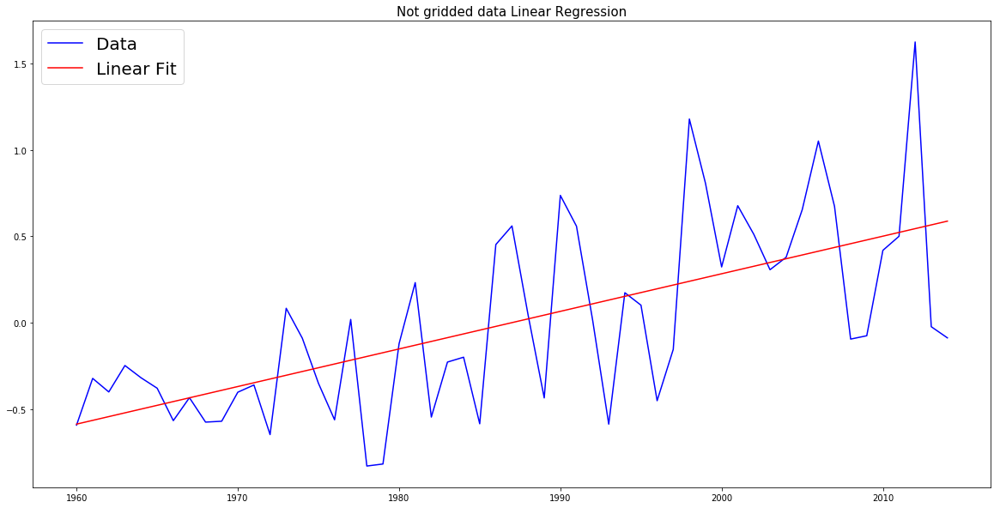

In [65]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


regr_obs = LinearRegression()
x_train = np.arange(1960,2015,1)
x_train.shape

x_train = x_train.reshape(-1,1)


regr_obs.fit(x_train,annual_mean.values)

y_pred_obs = regr_obs.predict(x_train)
fig = plt.figure(figsize = (20,10))
plt.plot(x_train,annual_mean.values,color = "blue",label = "Data")
plt.plot(x_train,y_pred_obs,color = "red" ,label = "Linear Fit")
#plt.plot(x_train,globt.data)
plt.legend(fontsize = 20)
#plt.legend(fontsize = 15)
plt.title("Not gridded data Linear Regression", fontsize = 15)
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot17.png")

r2 = r2_score(annual_mean.values,y_pred_obs)

print("R2-score : {}".format(r2))
print("Angular coefficient: {}".format(regr_obs.coef_))

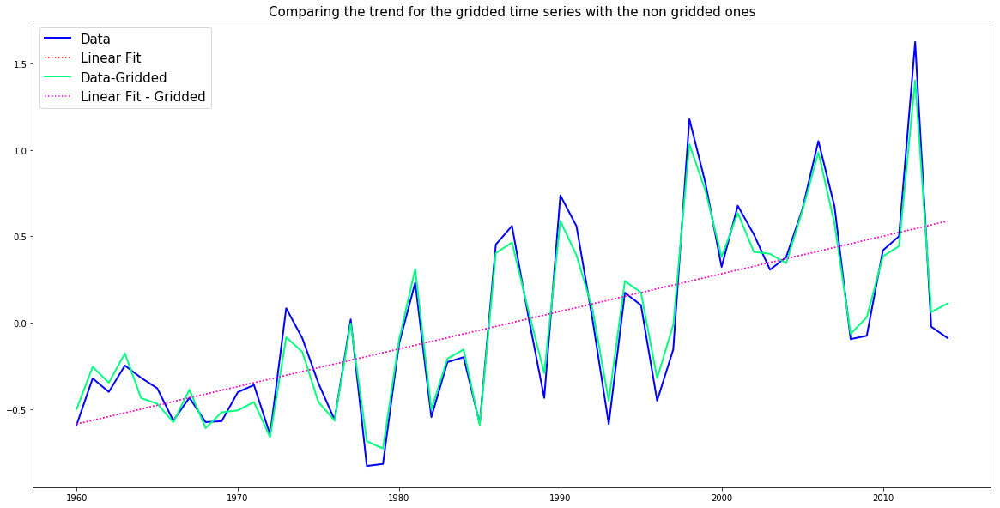

In [66]:
fig = plt.figure(figsize = (20,10))
plt.plot(x_train,annual_mean.values,linewidth = 2,color = "blue",label = "Data")
plt.plot(x_train,y_pred_obs,':',color = "red" ,label = "Linear Fit")
plt.plot(x_train,globw.data,linewidth = 2,color = "springgreen",label = "Data-Gridded")
plt.plot(x_train,y_pred_obs,':',color = "magenta" ,label = "Linear Fit - Gridded")
plt.legend(fontsize = 15)
plt.title("Comparing the trend for the gridded time series with the non gridded ones", fontsize = 15)
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot18.png")

<font size = 4> As we can see the two trends are very similar. The gridding method return the same results of the single station method. 

<center><h1> MODEL </h1></center>

<font size = 4> We load a model, in particular the <b>Amon MRI ESM20(1850-2014)</b> one. 
I will make an analysis in order to compare the observations results with the model one in order to make a comparison and conclude if the model can be adapted on the observations or not and so if the model can do some good predictions or not.

<font size = 4> First of all we load some libraries. In particular the xarray one that permits us to load the data contained in the <i>nc</i> file.

In [67]:
from ncdump import ncdump
import xarray as xr
import math as mt
from glob import glob as glb
from cartopy.util import add_cyclic_point
import matplotlib as mpl


/home/wahid/anaconda3/lib/python3.6/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}
/home/wahid/anaconda3/lib/python3.6/site-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [68]:
#models = "../Data/ts_Amon_MRI-ESM2-0_historical_r1i1p1f1_gn_185001-201412.nc"
models = "../Data/ts_Amon_MRI-ESM2-0_historical_r1i1p1f1_gn_185001-201412.nc"
models

'../Data/ts_Amon_MRI-ESM2-0_historical_r1i1p1f1_gn_185001-201412.nc'

<font size = 4 >Loading the data in a xarray <code>ds</code>. Since we want to compare the model with the observations we need the same range of longitudes and latitudes and the same units on temperature. So we transform the longitudes in order to have them in the range [-180,180] instead of [0,360]. Therefore we convert the temperature from kelvin to Celsius.

In [69]:

    
ds = xr.open_dataset(models)
ds.coords['lon'] = (ds.coords['lon'] + 180) % 360 - 180
ds = ds.sortby(ds.lon)

mts = ds.ts - 273.15


    

<font size = 4> We select the time of interest as the one chosen before and then we can plot on a Robinson projection the temperature mean of the whole period.

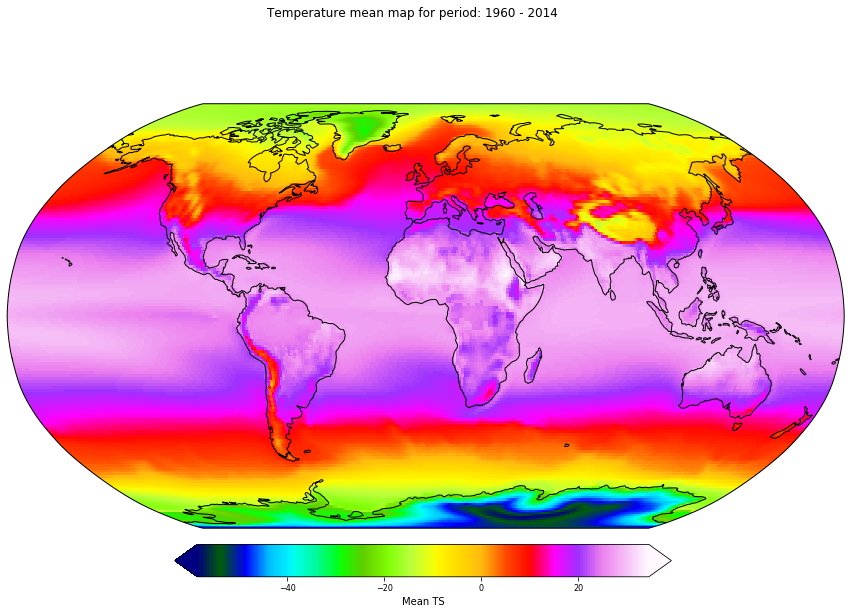

In [70]:
#psl = ds.psl / 100 #From Pa to hPa
mts_t = mts.sel(time = slice("1960-01","2014-12"))
anomaly_psl = mts_t.mean('time')
time_loop = np.arange(1960,2014,1)


fig = plt.figure(figsize=(15,9))
ax = plt.axes(projection=ccrs.Robinson())
ax.coastlines()
#plt.title('1900-1950 model: {}'.format(mod_name))
mpsl_avg_cyc, mlons_cyc = add_cyclic_point(anomaly_psl, coord=anomaly_psl.lon)
mlats = anomaly_psl.lat
fig.suptitle("Temperature mean map for period: {}".format("1960 - 2014"))
mm = ax.pcolormesh(mlons_cyc, mlats, mpsl_avg_cyc, \
                   transform=ccrs.PlateCarree(),cmap=mpl.cm.gist_ncar )
#anomaly_psl.plot()

cbar_ax = fig.add_axes([0.28, 0.10, 0.46, 0.05]) #[left, bottom, width, height]
cbar = fig.colorbar(mm, cax=cbar_ax, extend='both', orientation='horizontal')
cbar.set_label('Mean TS') #($\mu g$ $m^{-3}$)
cbar.ax.tick_params(labelsize=8)
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot19.png")
#fig.savefig(out_path + '/1900-1950.pdf')
#plt.clf()
#plt.close()

<font size = 4 > In order to have an idea on the variation of temperature over the year I build a video which represents the temperature mean for every year.

In [71]:
from matplotlib import animation

'''
fig = plt.figure(figsize=(10,7))

ax = plt.axes(projection=ccrs.Robinson())
ax.coastlines()
pcm = ax.pcolormesh(mlons_cyc, mlats, mpsl_avg_cyc, \
                       transform=ccrs.PlateCarree(),cmap=mpl.cm.nipy_spectral)

cbar_ax = fig.add_axes([0.28, 0.10, 0.46, 0.05]) #[left, bottom, width, height]
cbar = fig.colorbar(pcm, cax=cbar_ax, extend='both', orientation='horizontal')


cbar.set_label('Mean PSL') #($\mu g$ $m^{-3}$)
cbar.ax.tick_params(labelsize=8)
'''
def animate0(i):
    mts_t = mts.sel(time = str(time_loop[i]))
    anomaly_ts = mts_t.mean('time')

    fig.suptitle("Year: {}".format(time_loop[i]))
    #plt.title('1900-1950 model: {}'.format(mod_name))
    mts_avg_cyc, mlons_cyc = add_cyclic_point(anomaly_ts, coord=anomaly_ts.lon)
    mlats = anomaly_ts.lat
    pcm = ax.pcolormesh(mlons_cyc, mlats, mts_avg_cyc, \
                       transform=ccrs.PlateCarree(),cmap=mpl.cm.gist_ncar )
   
    
    
    if(i % 5 == 0):
        print(i)
    return (pcm) 

anim0 = animation.FuncAnimation(fig, animate0, frames = range(0,len(time_loop)-1),blit = False, save_count = len(time_loop))
HTML(anim0.to_html5_video())


0
0
5
10
15
20
25
30
35
40
45
50


<font size = 4 > As we can see there are not to many variations during the years.

<font size = 4>As before I will slice on the USA region in order to do a comparison with the observations

In [72]:
mts_sel = mts.sel(lat=slice(min_lat,max_lat-15), lon = slice(min_lon+20,max_lon))


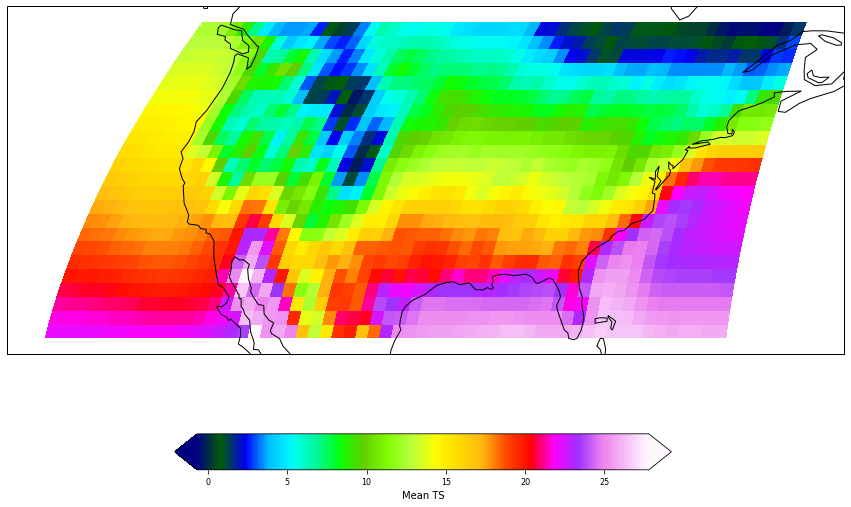

In [73]:

#psl = ds.psl / 100 #From Pa to hPa
mts_sel_t = mts_sel.sel(time =slice('1960-01', '2014-12'))
anomaly_ts = mts_sel_t.mean('time')

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.Robinson())
ax.coastlines()
#plt.title('1900-1950 model: {}'.format(mod_name))
mts_avg_cyc, mlons_cyc = add_cyclic_point(anomaly_ts, coord=anomaly_ts.lon)
mlats = anomaly_ts.lat
mm = ax.pcolormesh(mlons_cyc, mlats, mts_avg_cyc, \
                   transform=ccrs.PlateCarree(),cmap=mpl.cm.gist_ncar )
#anomaly_psl.plot()

cbar_ax = fig.add_axes([0.28, 0.10, 0.46, 0.05]) #[left, bottom, width, height]
cbar = fig.colorbar(mm, cax=cbar_ax, extend='both', orientation='horizontal')
cbar.set_label('Mean TS') #($\mu g$ $m^{-3}$)
cbar.ax.tick_params(labelsize=8)
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot20.png")
#fig.savefig(out_path + '/1900-1950.pdf')<<<<<<<<<<<<<<<<<<<<<a
#plt.clf()
#plt.close()

<font size = 4>I want to have an idea if the model can predict the observations. I will compare the monthly time series of one station only.


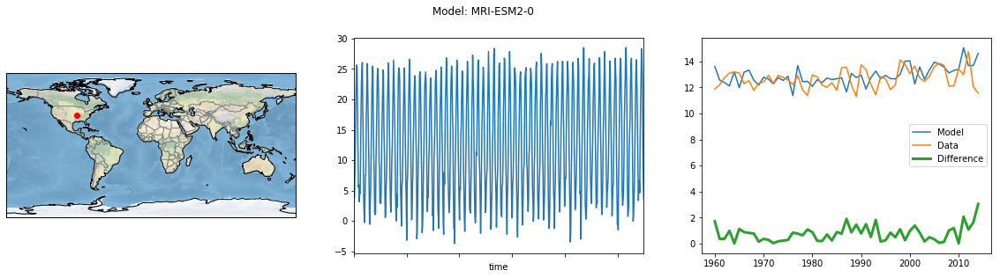

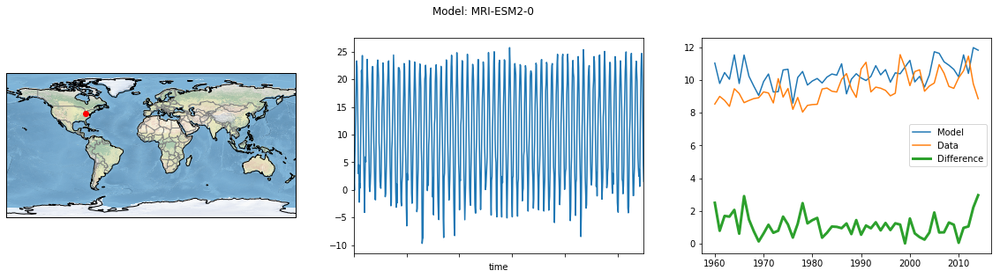

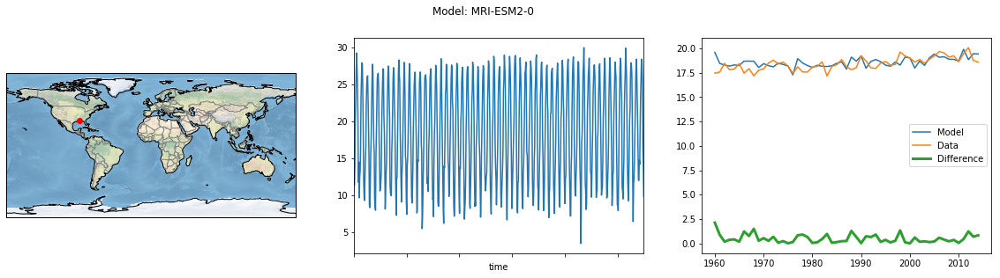

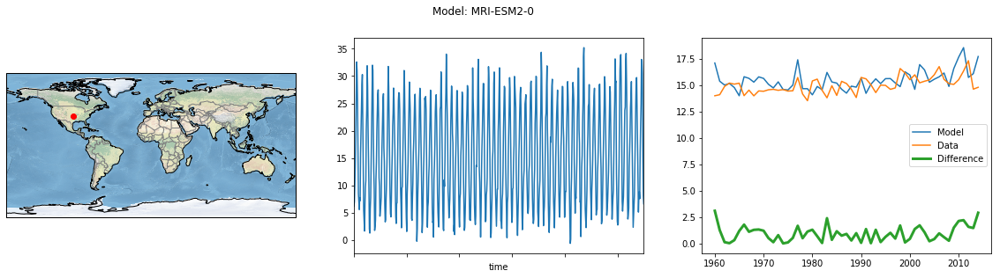

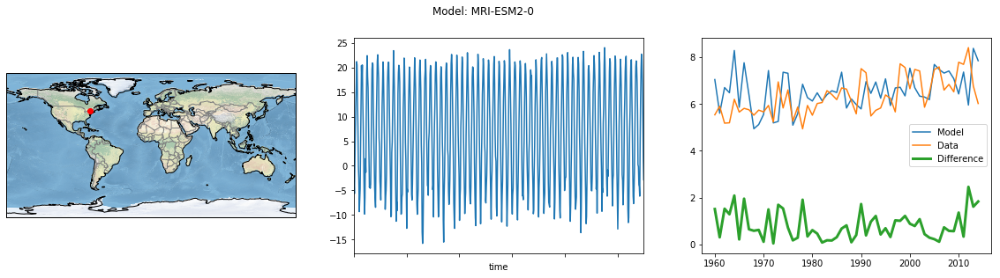

In [74]:
c= 0
Diff = []
#print("Model: {}".format(models[c]))        




for i in range(0,5):
    
    fig = plt.figure(figsize = (20,5))
    ax = fig.add_subplot(1,3,1, projection = ccrs.PlateCarree())
    ax.set_global()
    ax.stock_img()
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, edgecolor = 'gray')
    ax.add_feature(cfeature.LAND)
    plt.suptitle("Model: {}".format(models[16:26]))
    ax.plot(lon_slice[i],lat_slice[i],color = 'red', linewidth = 10, marker='o',\
            transform = ccrs.Geodetic())
    
    mts_time = mts.sel(time = slice('1960-01', '2014-12'))
    station = mts_time.sel(lon=lon_slice[i],lat=lat_slice[i], method = 'nearest')
    station_annual = station.groupby('time.year').mean('time')

    ax1 = fig.add_subplot(1,3,2)

    station.to_series().plot()
    ax2 = fig.add_subplot(1,3,3)
    station_annualnp = np.array(station_annual.to_series())
    anp = np.array(a.iloc[:,i])
    difft = abs(station_annualnp-anp)
    Diff.append(difft)
    #DIFF0.append(difft)


    ax2.plot(station_annual.to_series(), label = 'Model')#.plot(label = 'Model')

    ax2.plot(a.iloc[:,i],label = 'Data')
    ax2.plot(station_annual.year.values,difft,label = 'Difference', linewidth = 3)


    plt.legend()

    ax1.set_xticklabels([t for i,t in enumerate(ax1.get_xticklabels())], rotation = 30, fontsize = 10)
    plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot21.png")
    c=c+1

<font size = 4>As we can see from this five examples the model seems follow the trends of the observations. Clearly some fluctuations are presents, but if we consider the difference beetween the trends we can se that the fluctuations are near zero. 

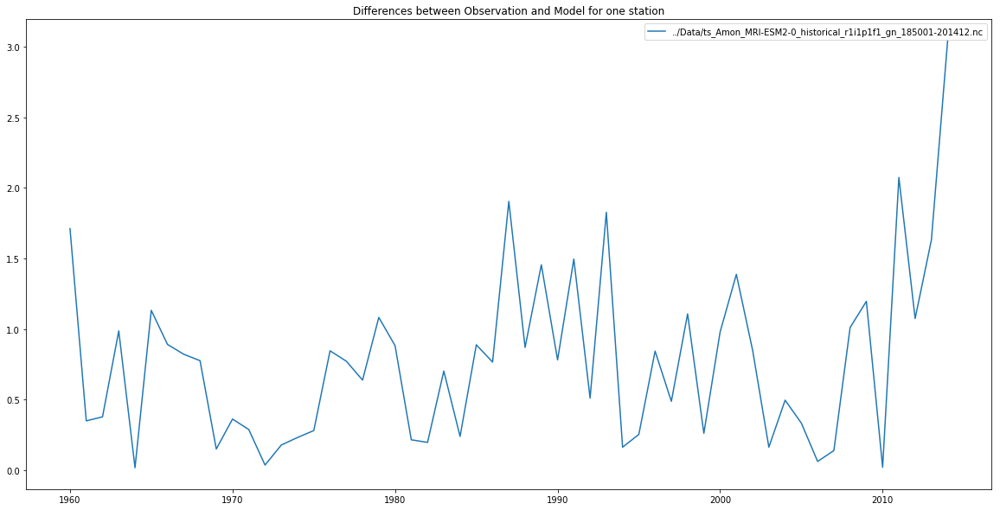

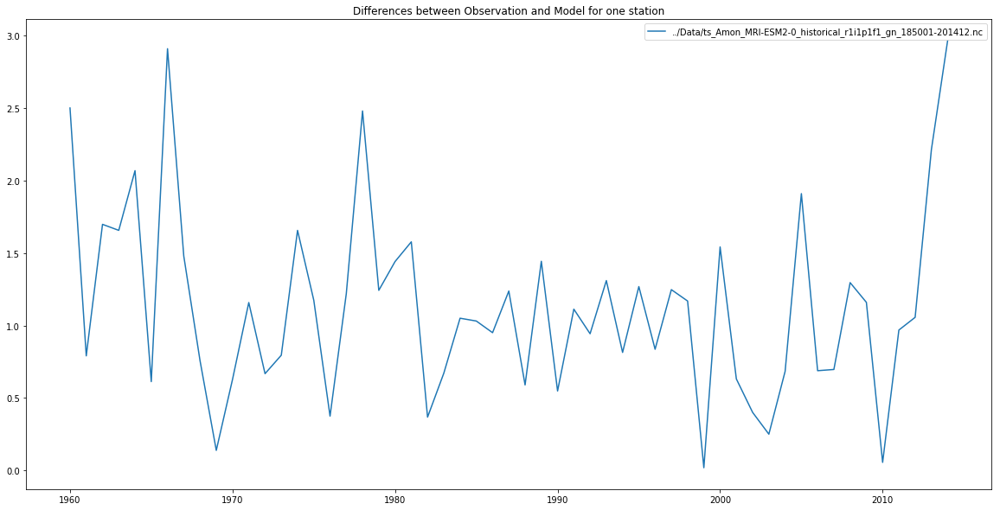

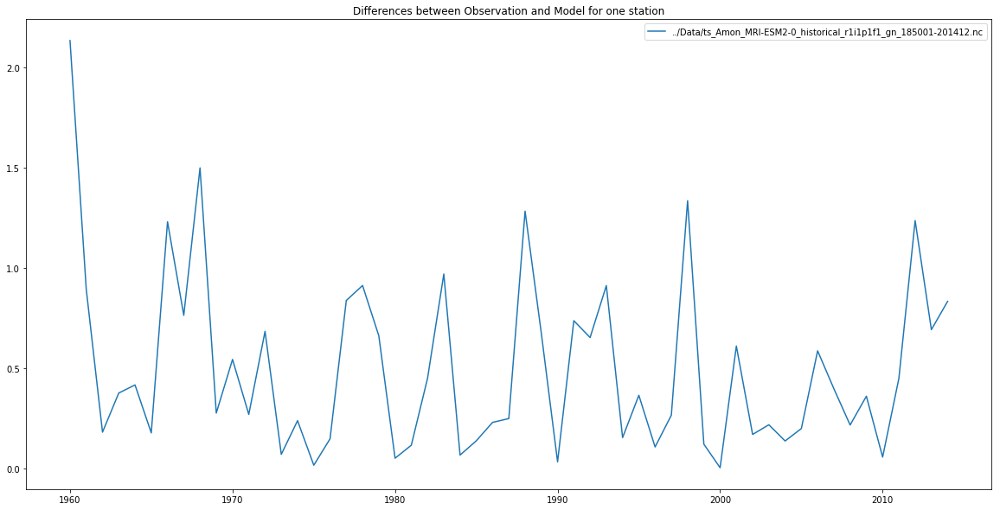

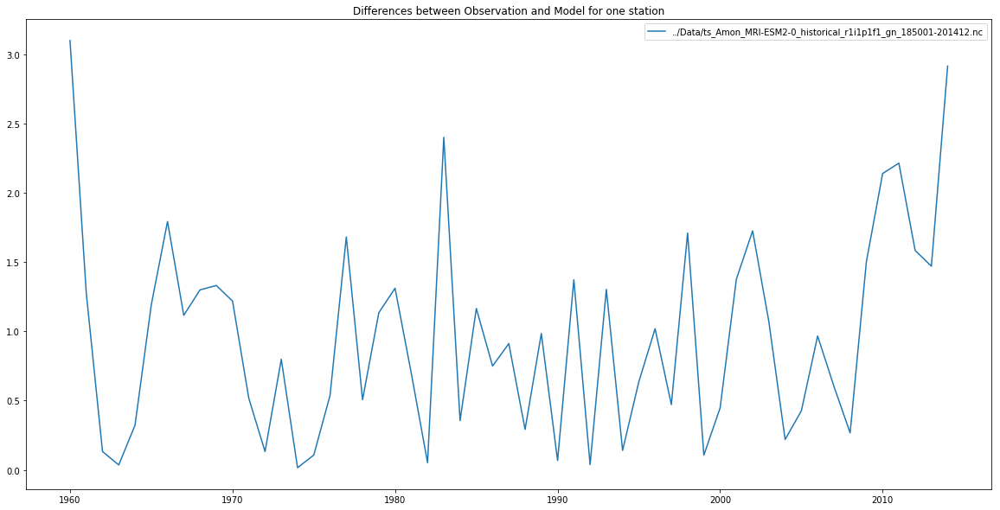

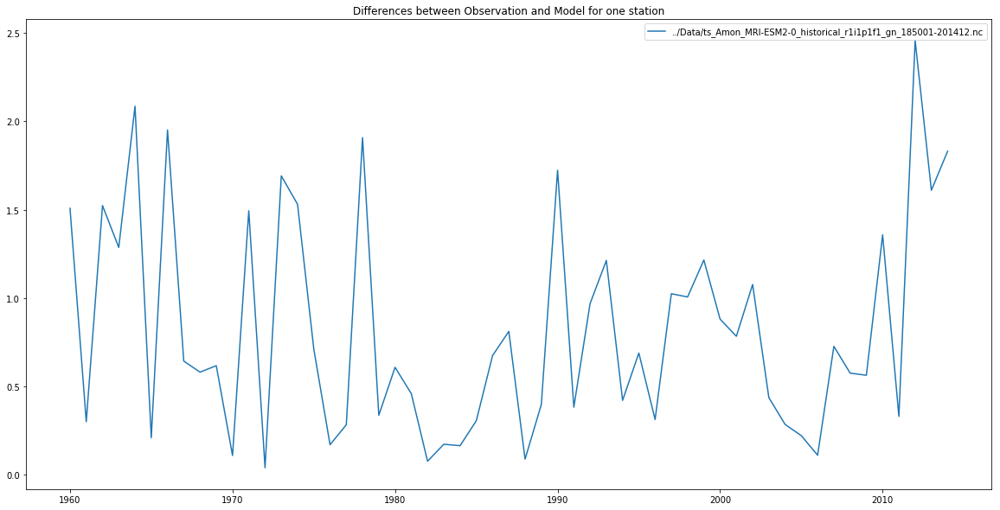

In [75]:
for i in range(0,len(Diff)):
    fig = plt.figure(figsize = (20,10))

    plt.plot(station_annual.year,Diff[i], label = models)
    plt.title("Differences between Observation and Model for one station")
    plt.legend()
    plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plo22.png")

<font size = 4>We can compare the observations with the model at monthly resolution of a year. I will get the average of each month over all the years available.

In [76]:
df_sliced_mean_month = df_sliced.groupby(df_sliced.index.month).mean()
df_sliced_mean_month_std = df_sliced.groupby(df_sliced.index.month).std()
c = df_sliced.groupby(df_sliced.index.month).std()


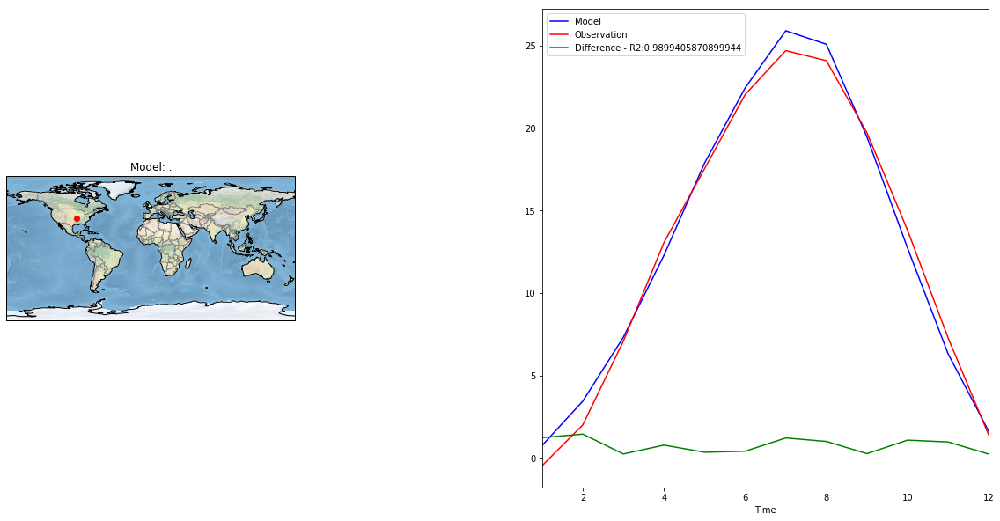

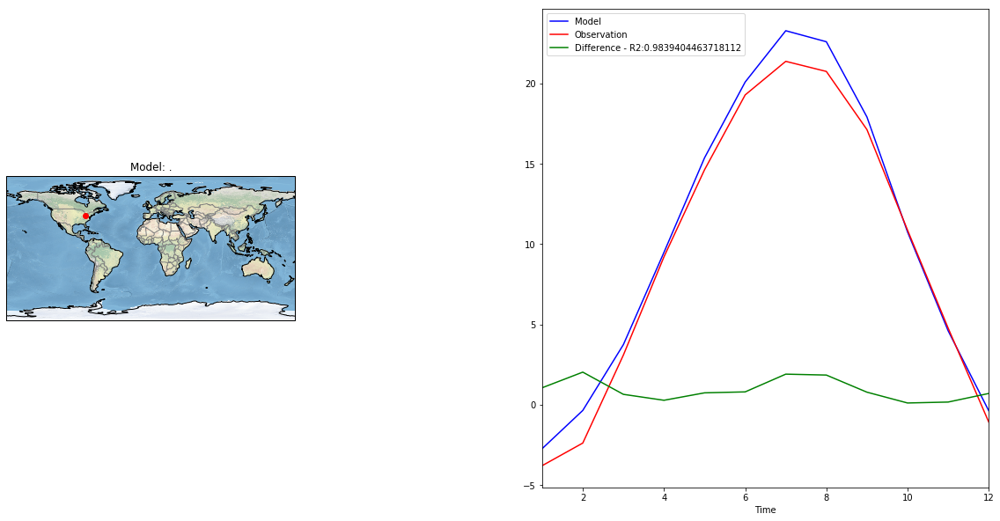

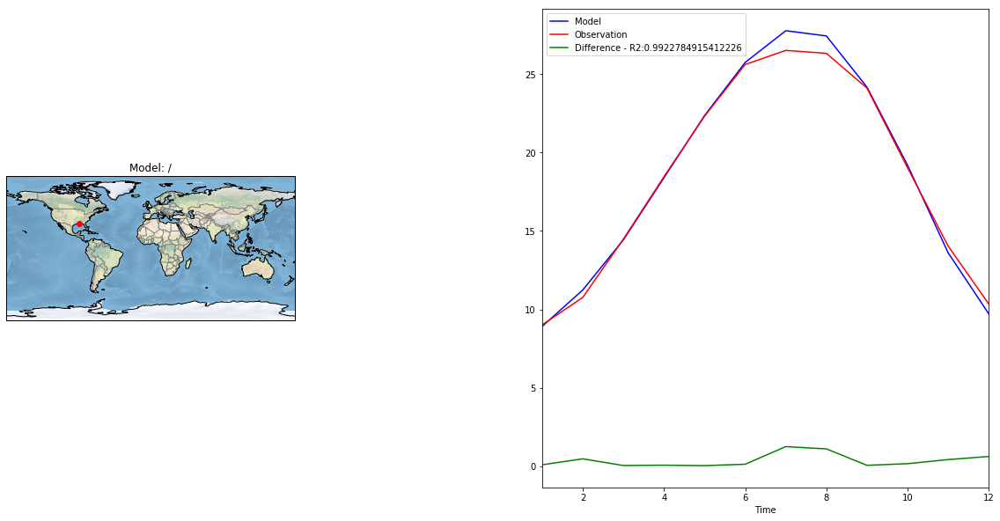

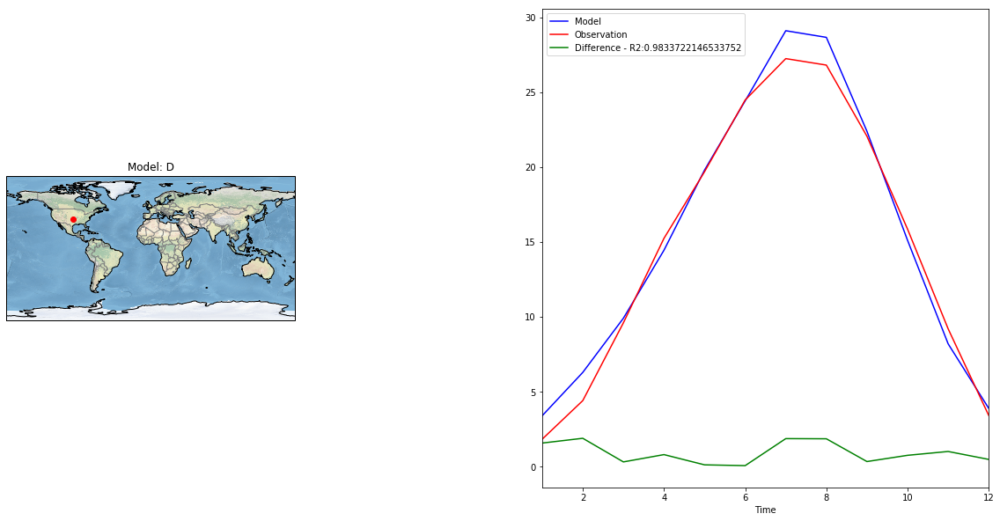

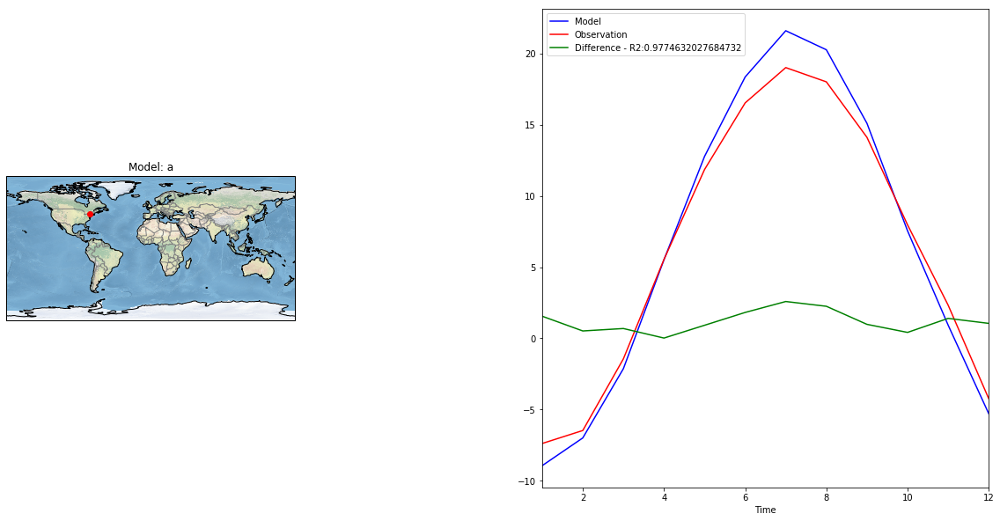

In [77]:
from sklearn.metrics import r2_score
cols = df_sliced_mean_month.columns
DIFF = []
#R2 = []
c = 0    

for i in range(0,5):
    fig = plt.figure(figsize=(20,10))


    region = mts.sel(time = slice('1960-01', '2014-12'))
    region = region.sel(lon=lon_slice[i],lat=lat_slice[i], method = 'nearest')
    region_month = region.groupby('time.month').mean('time')      


    ax = fig.add_subplot(1,3,1, projection = ccrs.PlateCarree())
    ax.set_global()
    ax.stock_img()
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, edgecolor = 'gray')
    ax.add_feature(cfeature.LAND)
    #plt.suptitle("Model: {}".format(models[c]))
    plt.title("Model: {}".format(models[c]))
    ax.plot(lon_slice[i],lat_slice[i],color = 'red', linewidth = 10, marker='o',\
            transform = ccrs.Geodetic())


    ax2 = fig.add_subplot(1,2,2)
    region_month.to_series().plot(label = 'Model', color = "blue")
    df_sliced_mean_month[cols[i]].plot(label = 'Observation', color = "red")  
    difference = abs(df_sliced_mean_month[cols[i]]-region_month.values)
    DIFF.append(difference)
    region_monthnp = np.array(region_month.to_series())
    stationnp = np.array(df_sliced_mean_month[cols[i]])

    r2 = r2_score(stationnp,region_monthnp)
    #R2.append(r2)
    ax2.plot(difference,label ='Difference - R2:{}'.format(r2), color = "green")
    plt.legend()

    ax1.set_xticklabels([t for i,t in enumerate(ax1.get_xticklabels())], rotation = 30, fontsize = 10)
    plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot23.png")



    c=c+1


<font size = 4>As it can be seen, even in this case the model seems to follow in a good way the observations trends. In fact the R2-score (which permit to compare to distribution) has a value greater than 0.9 which tell us that the two distribution are very similar. Moreover we can have a look on the difference trend.

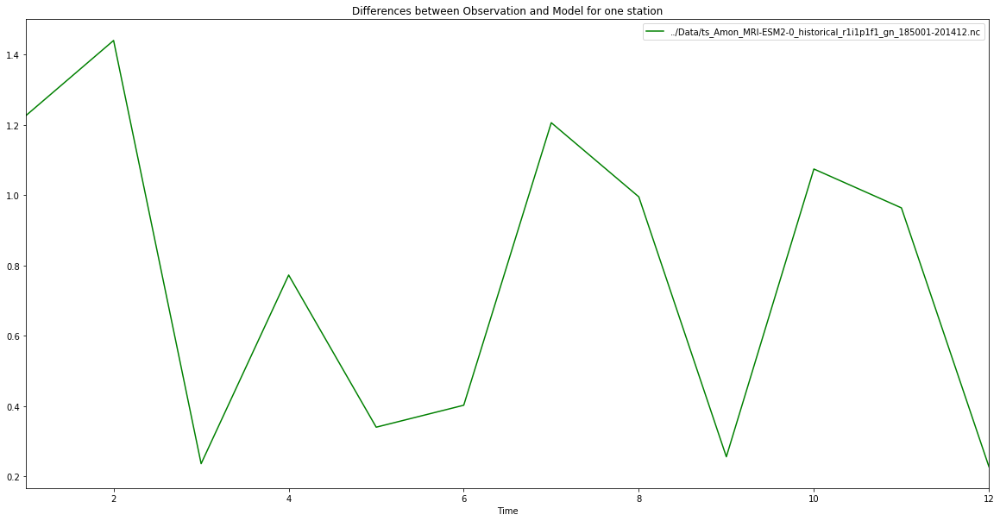

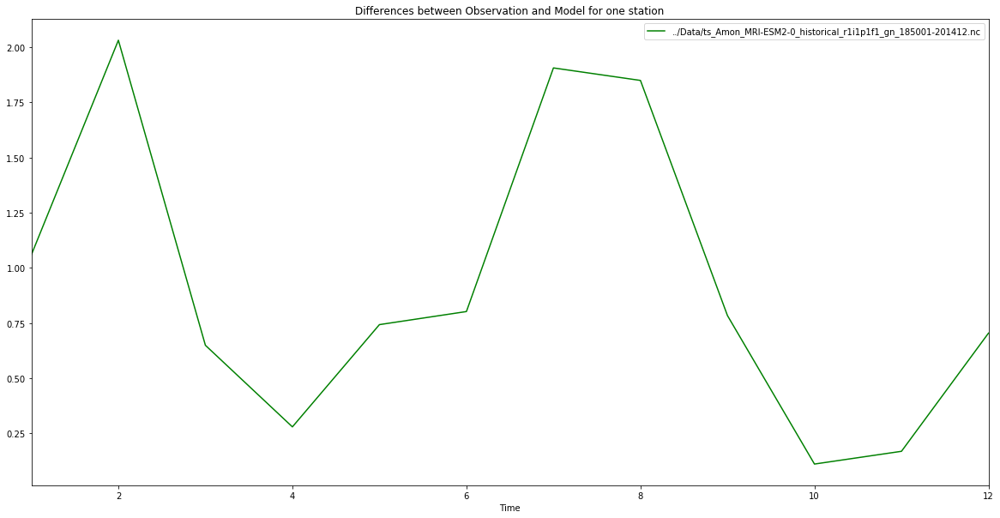

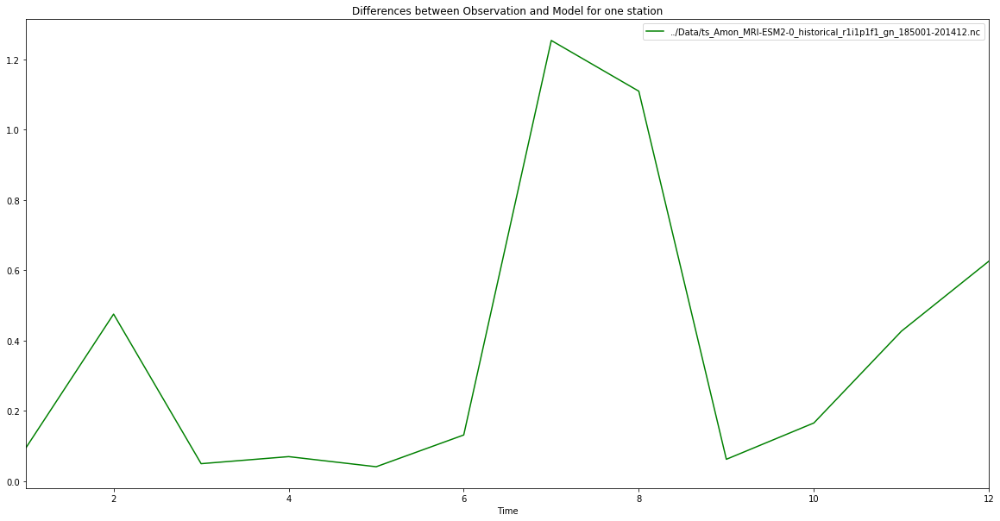

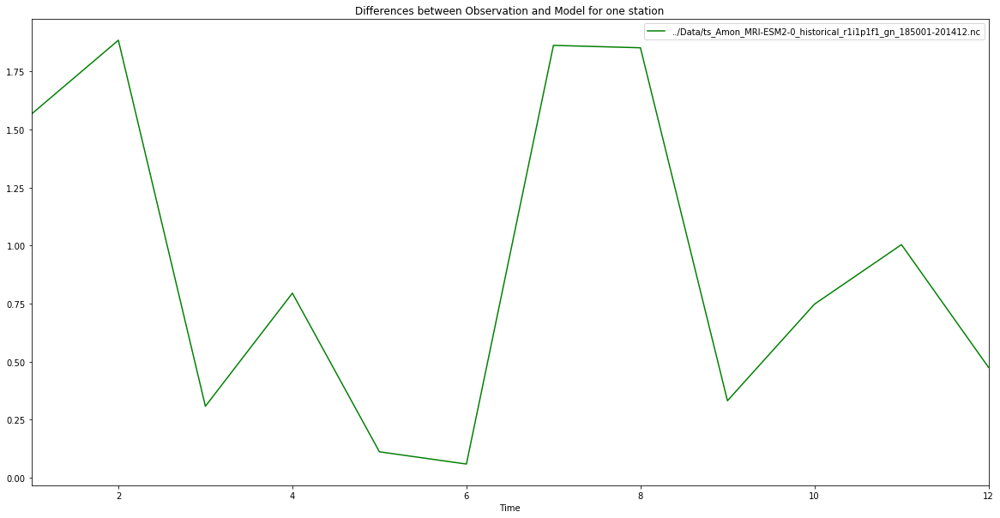

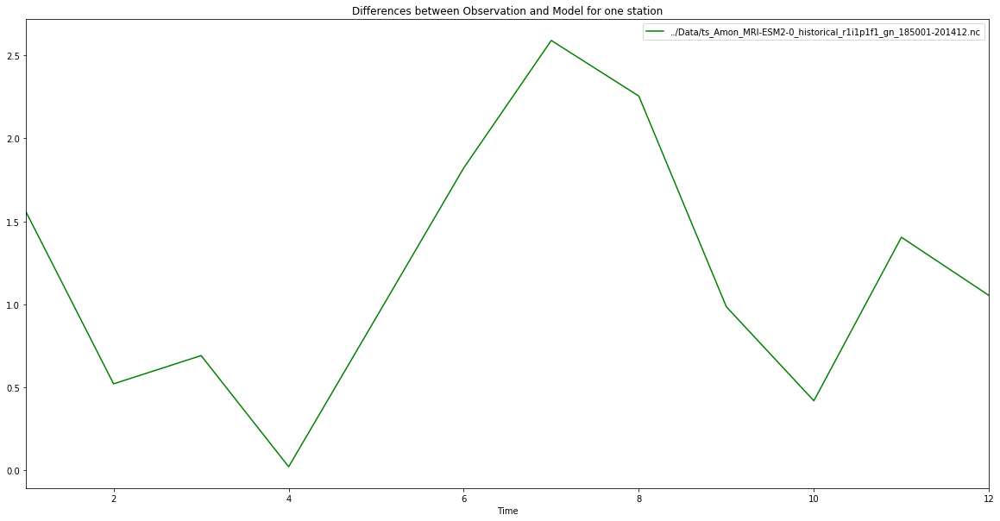

In [78]:
for i in range(0,len(DIFF)):
    fig = plt.figure(figsize = (20,10))


    DIFF[i].plot(label = models, color = "green" )
    plt.title("Differences between Observation and Model for one station")
    plt.legend()
    plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot24.png")

<font size = 4>We can see that the difference is near the zero value. We can look at a reccurent behaviour: the model move away from the distribution in the summer season, and the model has always a temperature greater than the observation.

<font size = 4>I will compute the yerly time series of the USA region and then I will compare this trend with the one obtained with the analysis on the CRUTEM observations.

In [79]:
usa_slice = mts.sel(time = slice('1960-01', '2014-12'))
usa_slice = usa_slice.sel(lat=slice(min_lat,max_lat-15), lon = slice(min_lon+20,max_lon))
usa_slice_year = usa_slice.groupby('time.year').mean() - usa_slice.mean()
usa_slice_year_std = usa_slice.groupby('time.year').std()

/home/wahid/anaconda3/lib/python3.6/site-packages/xarray/core/groupby.py:639: FutureWarning: Default reduction dimension will be changed to the grouped dimension in a future version of xarray. To silence this warning, pass dim=xarray.ALL_DIMS explicitly.
  skipna=skipna, allow_lazy=True, **kwargs)


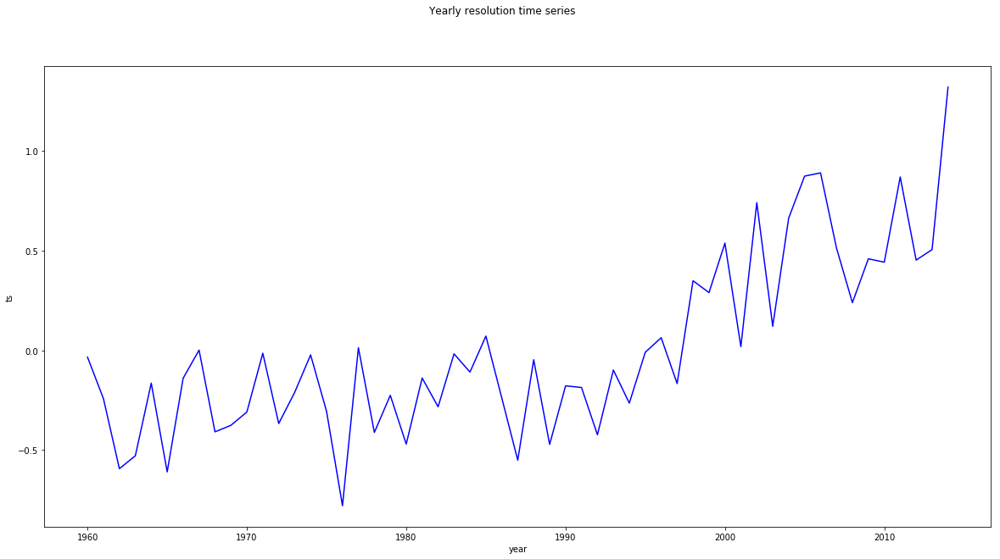

<Figure size 432x288 with 0 Axes>

In [80]:
fig = plt.figure(figsize = (20,10))
plt.suptitle("Yearly resolution time series")
usa_slice_year.plot(color = "blue")
plt.show()
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot25.png")

R2-score : 0.5599768968242969
Angular coefficient: [0.02069697]


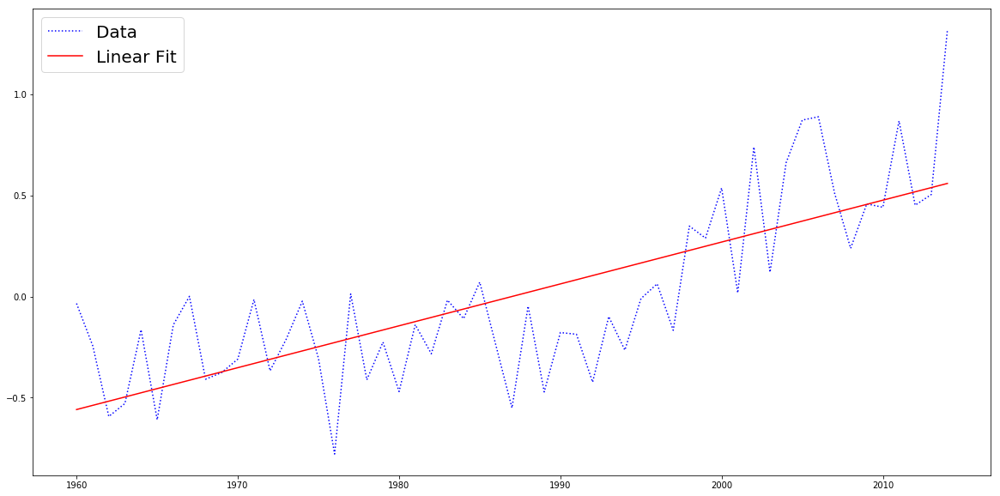

In [81]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


regr = LinearRegression()
x_train = np.arange(1960,2015,1)
x_train.shape

x_train = x_train.reshape(-1,1)


regr.fit(x_train,usa_slice_year.values)

y_pred = regr.predict(x_train)
fig = plt.figure(figsize = (20,10))
plt.plot(x_train,usa_slice_year,":",color = "blue",label = "Data")
plt.plot(x_train,y_pred,color = "red" ,label = "Linear Fit")
plt.legend(fontsize = 20)
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot26.png")
r2 = r2_score(usa_slice_year,y_pred)

print("R2-score : {}".format(r2))
print("Angular coefficient: {}".format(regr.coef_))

In [82]:
len(annual_mean.values)

55

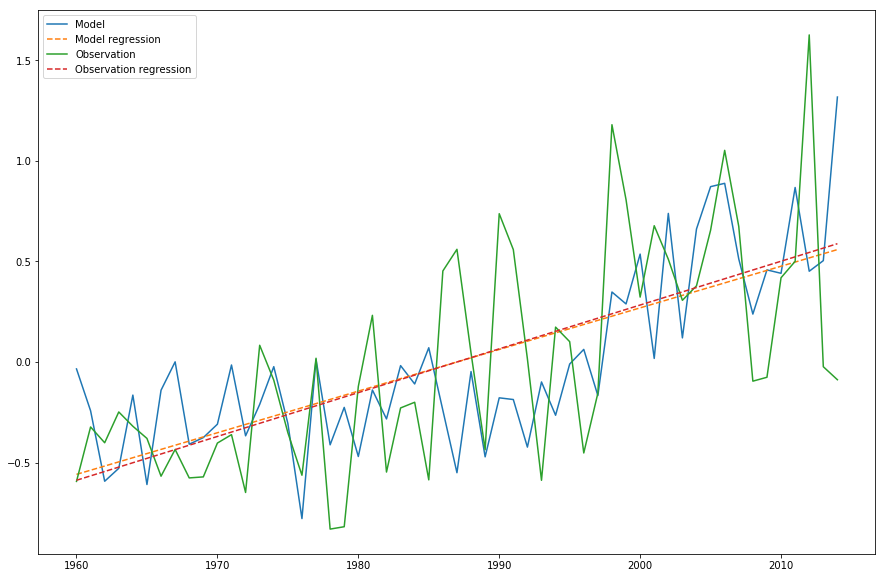

In [83]:
fig = plt.figure(figsize = (15,10))
plt.plot(x_train,usa_slice_year, label = 'Model')
plt.plot(x_train,y_pred, '--', label = 'Model regression')
plt.plot(x_train, annual_mean.values, label = 'Observation')
plt.plot(x_train, y_pred_obs, '--', label = 'Observation regression')
plt.legend()
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot27.png")

<font size = 4>As we can see we have a similar regression but if we observe the trends we can notice a lot of difference. We have to keep in mind that the slice on the model contains the sea temperature the give us a bias on the trend. We can do a better comparison choosing the coordinates corresponding to the ones of the stations in the CRUTEM observation. 

In [84]:
temperature_year = []
pbar = tqdm_notebook(range( len(lon_slice)), desc = "Selecting the Observations")
for i in range(0,len(lon_slice)):
    region_t = mts.sel(time = slice('1960-01', '2014-12'))
    region_s = region_t.sel(lon = lon_slice[i], lat = lat_slice[i], method = 'nearest')
    t = (region_s.groupby('time.year').mean() - region_s.mean()).values 
    temperature_year.append(t)
    pbar.update()

pbar.close()
    
    

In [85]:
temperature_year = np.array(temperature_year)
temperature_year = temperature_year.transpose()

In [86]:
time_temp = np.arange(1960,2015,1)
#time_temp.transpose()

In [87]:
stations_data = pd.DataFrame(temperature_year)


In [88]:
stations_data.index = time_temp
stations_data.head()

,0,1,2,3,4,5,6,7,8,9,...,1302,1303,1304,1305,1306,1307,1308,1309,1310,1311
1960,0.677269,0.665790,1.011238,1.610598,0.484023,-0.636261,0.331663,0.923842,1.406523,0.297130,...,1.789125,-0.264874,-0.287233,-1.153801,0.440588,-0.044675,-0.883686,-0.849674,0.948356,0.545361
1961,-0.367393,-0.576184,-0.120693,-0.109619,-0.956620,-1.080768,-0.132582,-0.436585,0.028531,-0.925170,...,-0.488361,-0.633745,0.613251,-0.403229,-0.231020,0.016068,-0.121309,-0.346330,-0.566291,-0.728946
1962,-0.553011,0.088778,-0.295298,-0.471293,0.141234,0.112388,-0.028543,-0.148843,-0.887012,0.298180,...,-0.125517,-0.056931,-1.675272,-2.611900,-0.610727,-1.208920,-1.948452,-2.114717,-0.116718,0.114069
1963,-0.811902,-0.319318,-0.396099,-0.322186,-0.079451,-0.455633,0.223442,0.142768,-0.416089,-0.008198,...,0.403612,-1.129135,-1.382975,-1.217268,-0.972129,-1.435732,-0.839830,-1.134268,0.030262,-0.052425
1964,0.283951,1.167239,-0.280680,-0.708934,1.728802,1.189913,0.077782,0.646871,-0.711998,1.582078,...,-1.371799,1.210310,-1.569613,0.426971,0.466152,0.100833,-0.280252,-0.169615,0.768403,1.624045


In [89]:
stations_data_mean = stations_data.mean(axis = 1) 

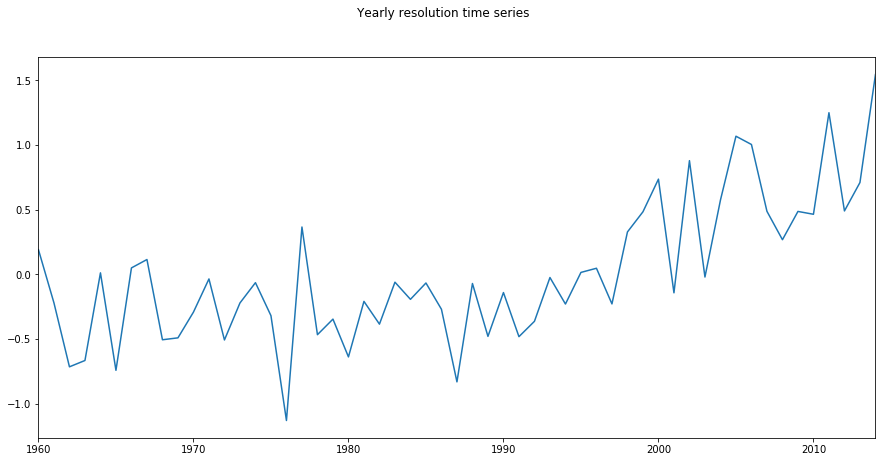

In [90]:
fig = plt.figure(figsize = (15,7))
plt.suptitle("Yearly resolution time series")
stations_data_mean.plot()

R2-score : 0.4576342770007852
Angular coefficient: [0.02304214]


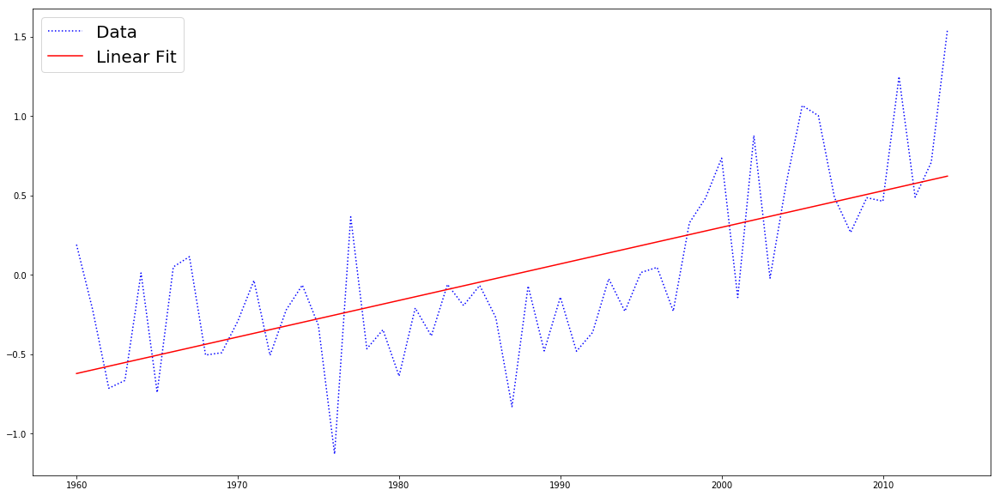

In [91]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


regr_mod_stat = LinearRegression()
x_train = np.arange(1960,2015,1)
x_train.shape

x_train = x_train.reshape(-1,1)


regr_mod_stat.fit(x_train,stations_data_mean.values)

y_pred_mod_stat = regr_mod_stat.predict(x_train)
fig = plt.figure(figsize = (20,10))
plt.plot(x_train,stations_data_mean,":",color = "blue",label = "Data")
plt.plot(x_train,y_pred_mod_stat,color = "red" ,label = "Linear Fit")
plt.legend(fontsize = 20)
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot28.png")

r2 = r2_score(stations_data_mean,y_pred_mod_stat)

print("R2-score : {}".format(r2))
print("Angular coefficient: {}".format(regr_mod_stat.coef_))

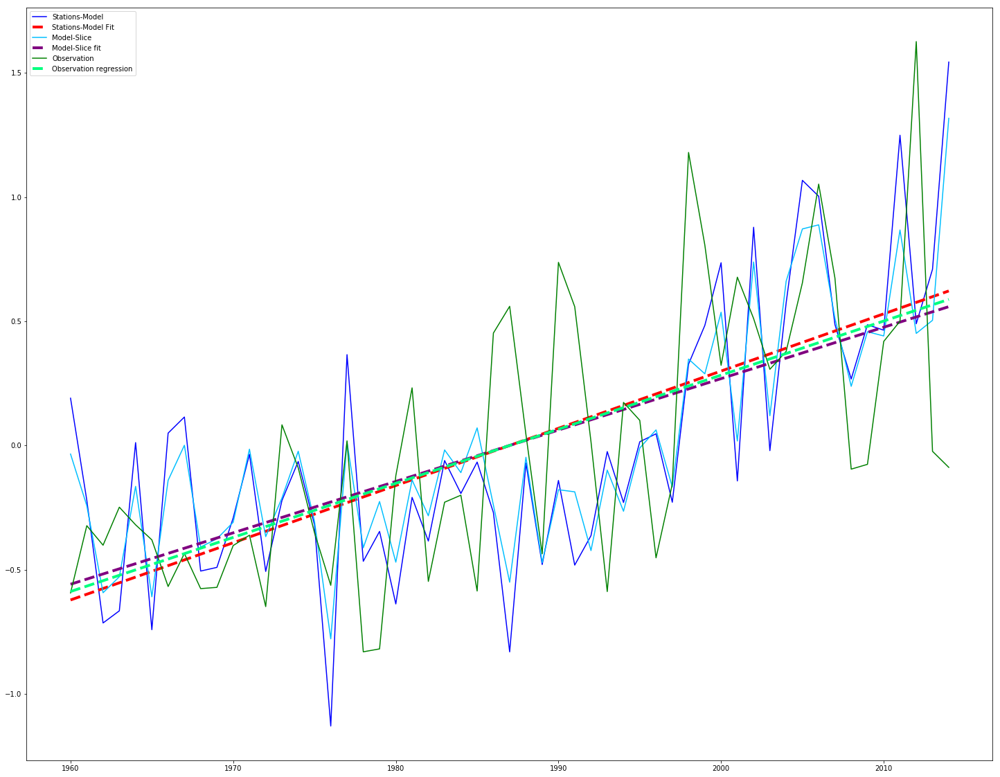

In [92]:
fig = plt.figure(figsize = (25,20))
plt.plot(x_train,stations_data_mean,color = "blue",label = "Stations-Model")
plt.plot(x_train,y_pred_mod_stat,'--',color = "red",linewidth = 4,label = "Stations-Model Fit")
plt.plot(x_train,usa_slice_year, color = "deepskyblue", label = 'Model-Slice')
plt.plot(x_train,y_pred, '--',color = "purple",linewidth = 4, label = 'Model-Slice fit')
plt.plot(x_train, annual_mean.values,color = "green",label = 'Observation')
plt.plot(x_train, y_pred_obs, '--',color = "springgreen",linewidth = 4, label = 'Observation regression')
plt.legend()
plt.savefig("/home/wahid/Wahid/University/BigData/BigDataGeo/Project/plot/plot29.png")


<font size = 4>As we can see from the last comparing the three trends have the almost the same slope. The model follows in a good way the observations. Clearly considering the single station location is better than to consider the slice around the region. This why with the slicing we consider some region of sea that has a different behaviour. In fact the temperature of the sea does not vary and this bring a shift on higher temperature. 
In the following the results summarized:
<ol>
    <li> Slice USA region: Angular coefficient: 0.021 </li>
    <li> Stations from model: Angular coefficient: 0.023 </li>
    <li> Stations from observations: Angular coefficient: 0.015 </li>
    
From that we can conclude that this model is a good prediction of the climate. The previous results  illustrate that the slope returned by the model is higher than the observation, but in a range of 54 years we can see that the model follows in a good way the observations. 